# Menu <a class="anchor" id="menu"></a>

    
* [1. olist_**geolocation**_dataset.csv](#data_geo)
    * [1.1 Analyses univariées](#data_geo_checks)
    * [1.2 Analyses multivarées](#data_geo_multi)
    
* [2. olist_**customers**_dataset.csv](#data_customers)
    * [2.1 Analyses univariées](#data_customers_checks)
    * [2.2 Analyses multivariées](#data_customers_multi)
    
* [3. olist_**orders**_dataset.csv](#data_orders)
    * [3.1 Analyses univariées](#data_orders_checks)
    * [3.2 Analyses multivarées](#data_orders_multi)
    
* [4. olist_order_**items**_dataset.csv](#data_items)
    * [4.1 Analyses univariées](#data_items_checks)
    * [4.2 Analyses multivariées](#data_items_multi)
    
* [5. olist_**products**_dataset.csv](#data_products)
    * [5.1 Analyses univariées](#data_products_checks)
    * [5.2 Analyses multivariées](#data_products_multi)
    
* [6. olist_order_**payments**_dataset.csv](#data_payments)
    * [6.1 Analyses univariées](#data_payments_checks)
    * [6.2 Analyses multivariées](#data_payments_multi)
    
* [7. olist_**sellers**_dataset.csv](#data_sellers)
    * [7.1 Analyses univariées](#data_sellers_checks)
    * [7.2 Analyses multivariées](#data_sellers_multi)
    
* [8. olist_order_**reviews**_dataset.csv](#data_reviews)
    * [8.1 Analyses univariées](#data_reviews_checks)
    * [8.2 Analyses multivariées](#data_reviews_multi)
    
* [9. product_**category_name_translation**.csv](#data_categories)
    * [9.1 Analyses univariées](#data_categories_checks)

# Préparatifs 

In [1]:
import os
import re
# import math
import string
import datetime
import unicodedata
import json
from zipfile import ZipFile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.graphics.gofplots import qqplot
from scipy.stats import norm  #, uniform

# import warnings
# warnings.filterwarnings('ignore')

# import gc
# gc.enable()

# Voila interactivity
from __future__ import print_function
from ipywidgets import interact,FloatSlider,IntSlider,interactive,HBox, VBox, Layout
import ipywidgets as widgets
from IPython.display import display, HTML

random_seed = 0
np.random.seed(random_seed)

In [2]:
def print_dataset_shape(data_):
    print(f"Ce dataset contient {data_.shape[0]} entrées décrites par {data_.shape[1]} variables")

In [3]:
def get_fill_rate(dataset):
    return dataset.notnull().mean(axis=0)


def print_fill_rate(dataset, col_array, sort_by_score=False):
    fill_ratio = get_fill_rate(dataset)*100.0
    fill_count = dataset[col_array].notnull().sum()

    total = dataset.shape[0]
    max_size = max([len(x) for x in dataset.columns])
    col_size = 15

    if sort_by_score:
        fill_count = fill_count.sort_values(ascending=False)

    print(f"{'COLUMN NAME'.rjust(max_size)} | {'EMPTY ROWS'.center(col_size)} | {'FILLING RATE'.rjust(col_size)} \n{'-'*111}")

    for k, v in fill_count.iteritems():
        fraction = fill_ratio[k]
        print(f"{k.rjust(max_size)} | {total-v:15} | {fraction:15.2f}%")

    return fill_ratio

In [4]:
def print_unique(data_, columns_):
    for col_name in columns_:
        print(f"{col_name.ljust(20)}\n{data_[col_name].unique()}\n")

In [5]:
def strip_accents(s):
    return ''.join(c for c in unicodedata.normalize('NFD', s) if unicodedata.category(c) != 'Mn')

In [6]:
def remove_format(text):
    # remove punctuation + space
    text = re.sub(f"[{string.punctuation} ´³£º]", "_", text)
    # remove uppercase
    text = text.lower()
    # remove accents
    return strip_accents(text)

In [7]:
def check_dates(data_, columns_):
    for date_col in columns_:
        data = data_[date_col].copy()
        data.dropna(inplace=True)
        print(f"{date_col.ljust(30)} : FROM  {data.min()}  TO  {data.max()}")

In [8]:
def plot_bars(data_, title, labels_modulo=1, labels_rotation=90, show_values=True, x_label=None, y_label="Nombre de commandes"):

    fig = plt.figure(figsize=(15, 4))
    ax = sns.barplot(data=selection)
    if show_values:
        ax.bar_label(ax.containers[0])
    new_ticks = [i.get_text() for i in ax.get_xticklabels()]
    plt.xticks(range(0, len(new_ticks), labels_modulo), new_ticks[::labels_modulo], rotation=90)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.title(title)
    plt.show()

In [9]:
def explore_quantitative(data, col_name):
    dt = data[col_name]
    print(f'----- UNIVARIATE ANALYSIS for "{col_name}" -----\n',dt.describe(),'\n', sep='\n')

    fig = plt.figure(figsize=(15, 8))

    ax = plt.subplot(2, 2, 1)
    sns.boxplot(x=dt[dt.notnull()])
    plt.title(f"Boxplot for '{col_name}'")

    ax = plt.subplot(2, 2, 2)
    sns.kdeplot(dt, color='red')
    plt.title(f"Density plot for '{col_name}'")

    ax = plt.subplot(2, 2, 4)
    ax.set_title(f"QQplot for {col_name}")
    qqplot(data[data[col_name].notnull()][col_name], norm, fit=True, line="45", ax=ax)

    ###  Missing
    total_size = data.shape[0]
    total_size_nonull = data[col_name].notnull().sum()
    total_size_null = data[col_name].isnull().sum()
    percent_v = 100/total_size*total_size_null

    ax = plt.subplot(2, 2, 3)
    plt.pie(list([total_size_null, total_size_nonull]), labels=["", ""], autopct=lambda x: f"{x:.2f}%", shadow=False)
    plt.title(f"Distribution between rows with and without '{col_name}' values")
    plt.legend(["MISSING"], loc='lower center', bbox_to_anchor=(0, 0))

    fig.tight_layout()
    plt.show()

    print(f"'{col_name}' is missing {total_size_null} over {total_size} ({percent_v:.2f}%)")

# Les jeux de données

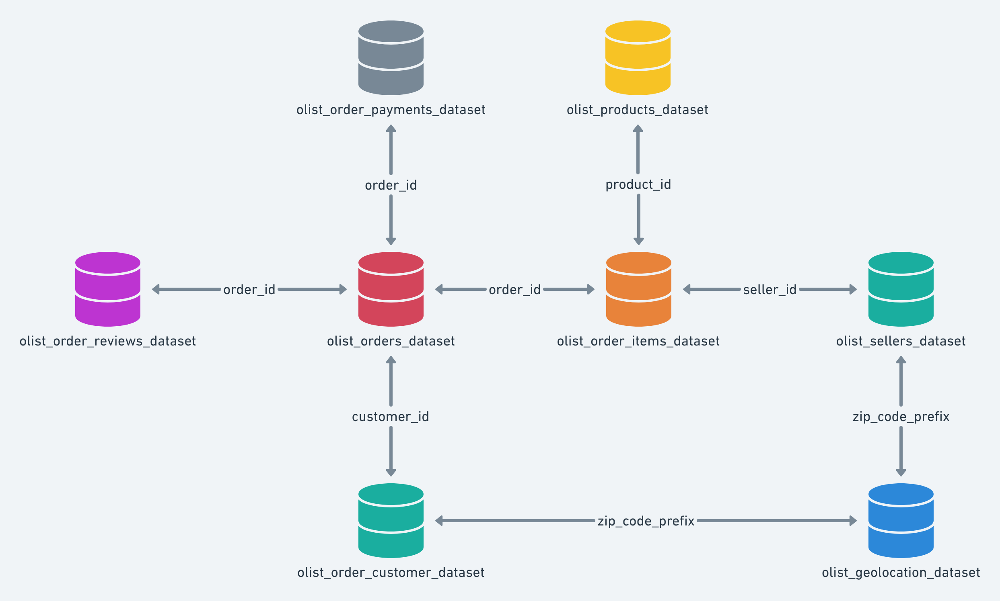

# 0. Commençons par charger tous les jeux de données
#### Ainsi, nous pourrons plus facilement faire des jointures pour les analyses multivariées

In [10]:
def load_from_zip(csv_name):
    return pd.read_csv(ZipFile(os.path.join("data", f"{csv_name}.zip")).open(csv_name))


data_geo = load_from_zip("olist_geolocation_dataset.csv")
data_customer = load_from_zip("olist_customers_dataset.csv")
data_orders = load_from_zip("olist_orders_dataset.csv")
data_items = load_from_zip("olist_order_items_dataset.csv")
data_products = load_from_zip("olist_products_dataset.csv")
data_payments = load_from_zip("olist_order_payments_dataset.csv")
data_reviews = load_from_zip("olist_order_reviews_dataset.csv")

data_sellers = pd.read_csv(os.path.join('data', "olist_sellers_dataset.csv"))
data_categories = pd.read_csv(os.path.join('data', "product_category_name_translation.csv"))

---
---
# 1. `olist_geolocation_dataset.csv` <a class="anchor" id="data_geo"></a> [⇪](#menu)

In [11]:
data_geo.sample(5)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
171705,6775,-23.637880,-46.797503,taboao da serra,SP
435685,21940,-22.817453,-43.201590,rio de janeiro,RJ
692503,45651,-14.782525,-39.048806,ilheus,BA
504808,27260,-22.521049,-44.107054,volta redonda,RJ
886897,86150,-22.777128,-51.227601,alvorada do sul,PR


>#### Ce sont des indicateurs géographiques qui permettent de localiser les clients et fournisseurs.
> - `geolocation_zip_code_prefix` est le code postal *(les 5 premiers chiffres sur 8)* utilisé comme ID par plusieurs autres tables *(`olist_customers_dataset.csv` et `olist_sellers_dataset.csv`)*
> - `geolocation_lat` est la lattitude de ce point géographique
> - `geolocation_lng` est la longitude de ce point géographique
> - `geolocation_city` est la ville du client ou fournisseur *(que l'on retrouve sous le nom de `customer_city` et `seller_city` dans `olist_customers_dataset.csv` et `olist_sellers_dataset.csv`)*
> - `geolocation_state` est la région du client ou fournisseur *(que l'on retrouve sous le nom de `customer_state` et `seller_state` dans `olist_customers_dataset.csv` et `olist_sellers_dataset.csv`)*

> #### Pour référence, voici comment fonctionne le code postal au Brésil
> 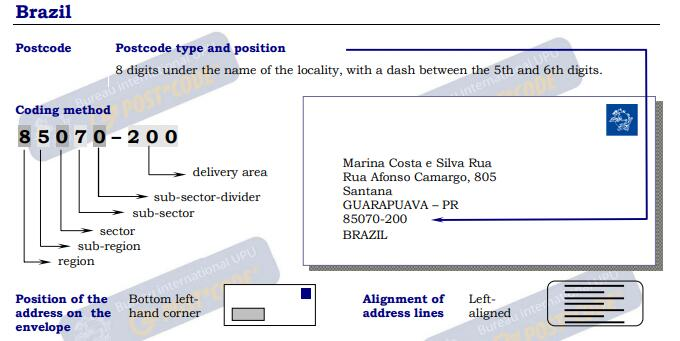

In [12]:
print_dataset_shape(data_geo)

Ce dataset contient 1000163 entrées décrites par 5 variables


## 1.1 Vérifications de base <a class="anchor" id="data_geo_checks"></a> [⇪](#menu)

In [13]:
data_geo.describe(include='number').T

,count,mean,std,min,25%,50%,75%,max
geolocation_zip_code_prefix,1000163.0,36574.166466,30549.335710,1001.000000,11075.000000,26530.000000,63504.000000,99990.000000
geolocation_lat,1000163.0,-21.176153,5.715866,-36.605374,-23.603546,-22.919377,-19.979620,45.065933
geolocation_lng,1000163.0,-46.390541,4.269748,-101.466766,-48.573172,-46.637879,-43.767709,121.105394


>#### Il ne semble pas y avoir de valeurs aberrantes.
> - Les données de latitudes sont bel et bien comprises entre -90 et 90.
> - Les données de longitudes sont bel et bien comprises entre -180 et 180.
> - Les prefix de code postaux utilisés sont bel et bien composés de 5 chiffres comme indiqués dans la doc. Les valeurs en 4 chiffres sont en fait des codes postaux commençant par 0.

### Valeurs manquantes

In [14]:
_ = print_fill_rate(data_geo, data_geo.columns)

                COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
geolocation_zip_code_prefix |               0 |          100.00%
            geolocation_lat |               0 |          100.00%
            geolocation_lng |               0 |          100.00%
           geolocation_city |               0 |          100.00%
          geolocation_state |               0 |          100.00%


>#### Aucune valeur n'est manquante

### Valeurs uniques

In [15]:
data_geo.nunique()

geolocation_zip_code_prefix     19015
geolocation_lat                717360
geolocation_lng                717613
geolocation_city                 8011
geolocation_state                  27
dtype: int64

#### Regardons plus en détails les valeurs des colonnes catégorielles

In [16]:
print_unique(data_geo, ['geolocation_zip_code_prefix', 'geolocation_city', 'geolocation_state'])

geolocation_zip_code_prefix
[ 1037  1046  1041 ... 99910 99920 99952]

geolocation_city    
['sao paulo' 'são paulo' 'sao bernardo do campo' ... 'ciríaco' 'estação'
 'vila lângaro']

geolocation_state   
['SP' 'RN' 'AC' 'RJ' 'ES' 'MG' 'BA' 'SE' 'PE' 'AL' 'PB' 'CE' 'PI' 'MA'
 'PA' 'AP' 'AM' 'RR' 'DF' 'GO' 'RO' 'TO' 'MT' 'MS' 'RS' 'PR' 'SC']



>#### La plupart des labels sont propres, mais il y a des doublons dans les noms de villes.
> Certaines villes au nom composé avec des tirets sont retrouvables sans tirets, il en va de même avec les accents ==> são paulo, sao paulo, sao-paulo etc...

#### Appliquons une fonction pour harmoniser le format

In [17]:
data_geo.geolocation_city = data_geo.geolocation_city.apply(remove_format)

### Doublons

In [18]:
data_clean = data_geo.copy()
data_clean.shape

(1000163, 5)

#### Cherchons les doublons *(sur la base de l'ensemble des colonnes)*

In [19]:
data_clean.duplicated().sum()

279752

##### Supprimons ces doublons

In [20]:
data_clean.drop_duplicates(keep='first', inplace=True)
data_clean.shape

(720411, 5)

#### Puisque nos jeu de données clients et fournisseurs utilisent le `geolocation_zip_code_prefix` comme clé étrangère, vérifions s'ils sont uniques

In [21]:
subset_cols = ['geolocation_zip_code_prefix']
data_clean.duplicated(subset=subset_cols).sum()

701396

In [22]:
data_clean.groupby('geolocation_zip_code_prefix').size().mean()

37.886458059426765

> On constate une moyenne de 38 lignes dans le jeu de données pour chaque code postal...<br>
> Nous allons donc faire en sorte de ne garder qu'une seule ligne par code postal en faisant la moyenne de toutes leurs coordonnées GPS disponibles.

##### Calculons les longitudes et latitudes moyenne pour chaque code postal avant de supprimer les doublons

In [23]:
data_clean.geolocation_lat = data_clean.groupby('geolocation_zip_code_prefix').geolocation_lat.transform('median')
data_clean.geolocation_lng = data_clean.groupby('geolocation_zip_code_prefix').geolocation_lng.transform('median')

##### Supprimons ces doublons

In [24]:
data_clean.drop_duplicates(subset=subset_cols, keep='first', inplace=True)
data_clean.shape

(19015, 5)

#### Enfin vérifions s'il y a des coordonnées GPS identiques

In [25]:
subset_cols = ['geolocation_lat', 'geolocation_lng']
data_clean.duplicated(subset=subset_cols).sum()

14

> Les quelques code postaux qui ont les mêmes coordonnées GPS n'ont que très peu de représentants et pourraient être des erreurs de saisie.<br>
> Nous pourrions les supprimer, mais il y aurait alors des code postaux manquants dans la table... leur importance étant a-priori relative, nous pouvons les conserver.

#### Appliquons les modifications sur le jeu de données

In [26]:
data_geo = data_clean.copy()

## 1.2 Analyses multivariées <a class="anchor" id="data_geo_multi"></a> [⇪](#menu)

### Regardons sur une carte comment se répartissent les codes postaux avec les coordonnées GPS moyens

In [27]:
import folium
from folium.plugins import FastMarkerCluster

# Ici on définit les frontières du Brésil
with open('data/brazil.json', 'r') as f:
    brazil = json.load(f)

# Ici on crée une fonction définissant le rendu des pop-up de détail sur la carte Folium
callback = ('function (row) {'
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var latitude = row[0];'
                'var longitude = row[1];'
                'var zip_code = row[2];'
                'var city = row[3];'
                'var state = row[4];'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: '👨‍🦰',"
                "iconColor: 'white',"
                "markerColor: 'blue',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text: '<table><tbody><tr><td><b>Zip Code</b></td><td>'+zip_code+'</td></tr><tr><td><b>City</b></td><td>'+city+'</td></tr><tr><td><b>State</b></td><td>'+state+'</td></tr><tr><td><b>Latitude</b></td><td>'+latitude+'</td></tr><tr><td><b>Longitude</b></td><td>'+longitude+'</td></tr></tbody></table>'};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')

# Ici on instantie Folium avec des coordonnées de départ et un zoom raisonnable
map_ = folium.Map(location=["-10", "-46"], zoom_start=4, scrollWheelZoom=False)  # width=1100, height=1100, 

# Puis on ajoute chacun des points d'intéret sur notre map
select = data_geo
map_.add_child(FastMarkerCluster(

        select[["geolocation_lat", "geolocation_lng", "geolocation_zip_code_prefix", "geolocation_city", "geolocation_state"]].values.tolist(),
        showCoverageOnHover=True,
        spiderfyOnMaxZoom=False,
        disableClusteringAtZoom=20,
        callback=callback
))

folium.GeoJson(brazil, name="Brazil").add_to(map_)  # , tooltip="Brazil"
# Et on l'affiche
map_

>#### On remarque qu'il y a un certain nombre de code postaux dont les coordonnées GPS pointent en dehors du Brésil.
> Après vérification, il s'agit majoritairement (mais pas exclusivement) de mauvais coordonnées GPS pour des noms de villes qui se trouvent effectivement au Brésil.
>
> Il peut y avoir plusieurs raisons à ces anomalies:
> - un module GPS défaillant sur l'appareil de la personne qui commande.
> - une commande passée durant un voyage en avion.
> - une commande passée lors d'un séjour à l'étranger.
> - une commande passée par une personne vivant dans un autre pays.

#### Vérifions combien de situent en dehors des frontières géographiques du Brésil.

In [28]:
from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Feature, Polygon # MultiPolygon

brazilborders = brazil['features'][0]['geometry']['coordinates'][0]
polygon = Feature(geometry=Polygon([brazilborders]))

In [29]:
count_out = 0
for i, x in data_geo.T.iteritems():
    point = Feature(geometry=Point([x.geolocation_lng, x.geolocation_lat]))
    isin = boolean_point_in_polygon(point, polygon)
    if not isin:
        count_out += 1
        # print(x)
print(f"Sur les {data_geo.shape[0]} point géographique, {count_out} sont situés hors du Brésil terrestre.")

Sur les 19015 point géographique, 14 sont situés hors du Brésil terrestre.


>#### On a donc environ 14 points situés hors des frontières **terrestres** *(et approximatives)* du Brésil.
> - Certains de ces points sont en fait des iles dans les eaux nationales du Brésil.
> - ~~Certains de ces points sont très proches de la frontières et peuvent être comptés en dehors alors qu'ils sont sur le territoire.~~ *(corrigé avec un meilleur GeoJson)*
> - D'autres sont clairement hors du territoire national, mais les clients peuvent être des nationaux malgré tout.
>
> On constate cependant que c'est une infime fraction des points géographiques disponibles.

---
>#### `TODO`  done ✅ | todo ❌ |
> - ✅ Dans l'analyse multivariée, regarder comment se répartissement les code postaux sur le territoire.<br><u>*(action: fait un peu plus haut dans la section Analyses Multivariées)*</u>
> - ✅ Remplacer les caractères spéciaux dans les noms de villes pour supprimer les problèmes de doublons.<br><u>*(action: fait un peu plus haut dans la section Valeurs uniques)*</u>

In [30]:
data_geo.to_csv('data/olist_geolocation_dataset_clean.csv', index=False)

---
---
# 2. `olist_customers_dataset.csv` <a class="anchor" id="data_customers"></a> [⇪](#menu)

In [31]:
data_customer.sample(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
95572,1a74f36a8fef5459af7347cd87e71794,eb129673a452c0e5436b12fd03d5e815,37200,lavras,MG
25047,1f184001b4cbba29eb3ddefd7b0a195b,f4089943e1529aefcd2733e1eecf877a,88010,florianopolis,SC
47998,288f4f9c90d537bdcc404781e5b772f8,453d2b22a6d0a84e2ab99970f9c9761b,12210,sao jose dos campos,SP
89821,8cab6013b5bb046a5b91c60f05208cba,7453e76897787f054cb8194639518062,78061,cuiaba,MT
46620,1f31730a98a4a284d44af847aaaa1e45,dd370d681778805e13678d260d549f5a,20240,rio de janeiro,RJ


>#### On a un dataset qui propose les informations de propres aux utilisateurs *(ici il y en a peu car le jeu de données a été anonymisé)*.
> - `customer_unique_id` est un ID constant pour chaque client
> - `customer_id` est un ID de session pour un client donné lorsqu'il passe commande
>> Donc la première fois qu'un client vient sur le site il obtient un `customer_unique_id` et ensuite chaque fois qu'il vient commander il obtient un `customer_id` pour la durée de sa session *(donc possiblement plusieurs paniers)*
> - `customer_zip_code_prefix` est un ID *(le code postal en fait)* permettant d'avoir plus d'indicateurs géographiques via `olist_geolocation_dataset.csv`
> - `customer_city` est la ville du client *(que l'on retrouve sous le nom de `geolocation_city` dans `olist_geolocation_dataset.csv` via `customer_zip_code_prefix`)*
> - `customer_state` est la région du client *(que l'on retrouve sous le nom de `geolocation_state` dans `olist_geolocation_dataset.csv` via `customer_zip_code_prefix`)*

In [32]:
print_dataset_shape(data_customer)

Ce dataset contient 99441 entrées décrites par 5 variables


## 2.1 Vérifications de base <a class="anchor" id="data_customers_checks"></a> [⇪](#menu)

----- UNIVARIATE ANALYSIS for "customer_zip_code_prefix" -----

count    99441.000000
mean     35137.474583
std      29797.938996
min       1003.000000
25%      11347.000000
50%      24416.000000
75%      58900.000000
max      99990.000000
Name: customer_zip_code_prefix, dtype: float64




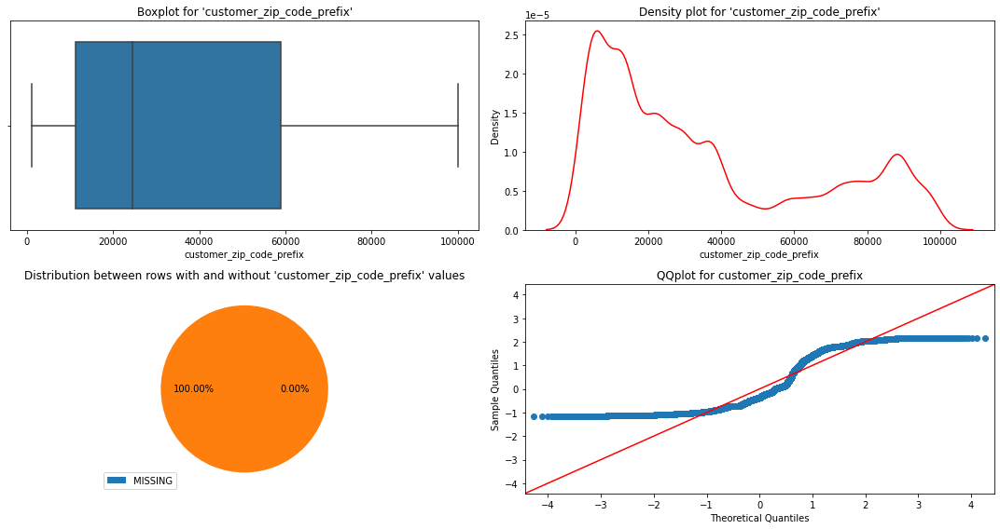

'customer_zip_code_prefix' is missing 0 over 99441 (0.00%)


In [33]:
explore_quantitative(data_customer, 'customer_zip_code_prefix')

>#### Dans la mesure ou le code postal est décrit comme étant composé de 5 chiffres, il ne semble pas y avoir de valeurs aberrantes.

### Valeurs manquantes

In [34]:
_ = print_fill_rate(data_customer, data_customer.columns)

             COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
             customer_id |               0 |          100.00%
      customer_unique_id |               0 |          100.00%
customer_zip_code_prefix |               0 |          100.00%
           customer_city |               0 |          100.00%
          customer_state |               0 |          100.00%


>#### Aucune valeur n'est manquante

### Valeurs uniques

In [35]:
data_customer.nunique()

customer_id                 99441
customer_unique_id          96096
customer_zip_code_prefix    14994
customer_city                4119
customer_state                 27
dtype: int64

>#### Il y a un peu moins de `customer_unique_id` que de `customer_id`.
> Il serait donc intéressant de voir quelle proportion des clients reviens après sa première commande.

#### Regardons plus en détails les valeurs des colonnes catégorielles

In [36]:
print_unique(data_customer, ['customer_zip_code_prefix', 'customer_city', 'customer_state'])

customer_zip_code_prefix
[14409  9790  1151 ...  5538 74980 99043]

customer_city       
['franca' 'sao bernardo do campo' 'sao paulo' ... 'monte bonito'
 'sao rafael' 'eugenio de castro']

customer_state      
['SP' 'SC' 'MG' 'PR' 'RJ' 'RS' 'PA' 'GO' 'ES' 'BA' 'MA' 'MS' 'CE' 'DF'
 'RN' 'PE' 'MT' 'AM' 'AP' 'AL' 'RO' 'PB' 'TO' 'PI' 'AC' 'SE' 'RR']



>#### La plupart des labels sont propres, mais il y a des doublons dans les noms de villes.
> Certaines villes au nom composé avec des tirets sont retrouvables sans tirets, il en va de même avec les accents ==> são paulo, sao paulo, sao-paulo etc...

#### Appliquons une fonction pour harmoniser le format

In [37]:
data_customer.customer_city = data_customer.customer_city.apply(remove_format)

### Doublons

In [38]:
data_customer.duplicated().sum()

0

In [39]:
cols = set(data_customer.columns) - set(['customer_id'])
num_dup = data_customer.duplicated(subset=cols).sum()
num_dup

3089

>#### Il y a donc visiblement aucun doublon si l'on considère toutes les colonnes, mais 3089 si l'on exclus la colonne `customer_id` qui est unique à chaque session.
> C'est du au fait que chaque client se voit attribuer un ID de session chaque fois qu'il revient passer commande. On a donc **96096 utilisateurs uniques**.

In [40]:
data_customer_unique = data_customer.copy()
data_customer_unique.drop_duplicates(subset=['customer_unique_id'], inplace=True)

## 2.2 Analyses multivariées <a class="anchor" id="data_customers_multi"></a> [⇪](#menu)

### Regardons quelle fraction des clients ont commandés plus d'une fois sur le site

In [41]:
ratio_multi = num_dup / data_customer.shape[0]
ratio_single = (data_customer.shape[0] - num_dup) / data_customer.shape[0]
print(f"Il y a {ratio_multi * 100:.2f}% des clients qui ont commandés plusieurs fois")

Il y a 3.11% des clients qui ont commandés plusieurs fois


<Figure size 360x288 with 0 Axes>

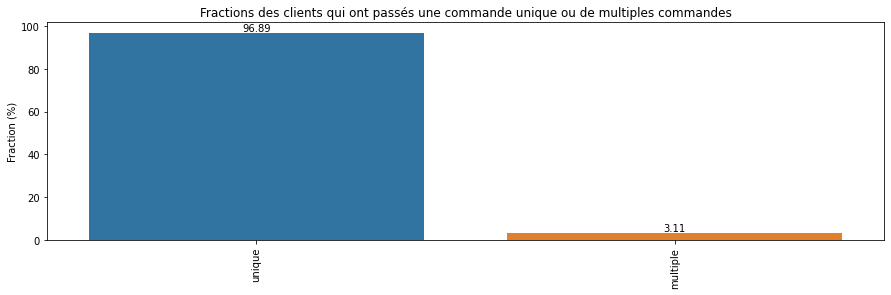

In [42]:
fig = plt.figure(figsize=(5,4))
selection = pd.DataFrame({'unique': [round(ratio_single*100, 2)], 'multiple': [round(ratio_multi*100, 2)]})

plot_bars(selection, "Fractions des clients qui ont passés une commande unique ou de multiples commandes", y_label='Fraction (%)')

### Regardons le nombre de commandes passées par client

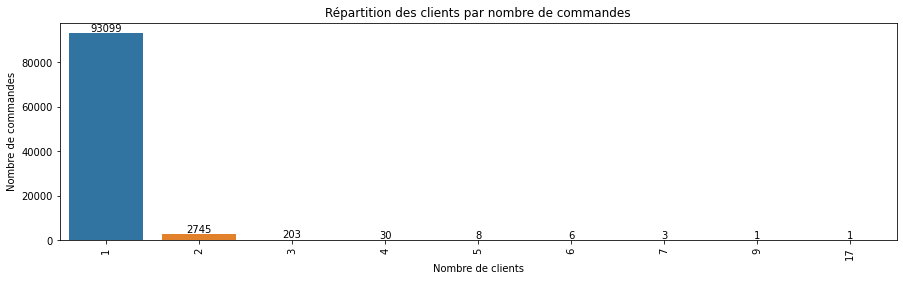

In [147]:
selection = data_customer.merge(data_orders, on='customer_id', how='left')
selection = pd.DataFrame(selection.groupby('customer_unique_id').size().value_counts()).T
plot_bars(selection, "Répartition des clients par nombre de commandes", y_label="Nombre de commandes", x_label='Nombre de clients')

>#### On note que:
> - Visiblement, tous les clients enregistrés dans le jeu de données ont passé commande au moins une fois.
> - La très grande majorité des clients n'ont commandé qu'une fois.
> - Seuls 19 clients ont commandés 5 fois ou plus.

### Regardons la répartition des clients uniques par région *(`customer_state`)*

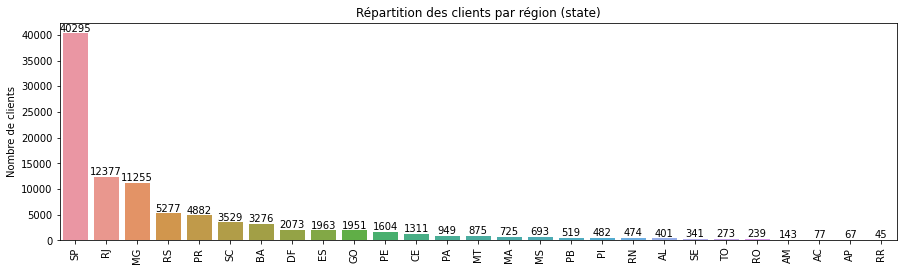

In [44]:
selection = pd.DataFrame(data_customer_unique.customer_state.value_counts()).T
plot_bars(selection, "Répartition des clients par région (state)", y_label="Nombre de clients")

### Regardons la répartition des clients uniques par ville *(`customer_city`)*

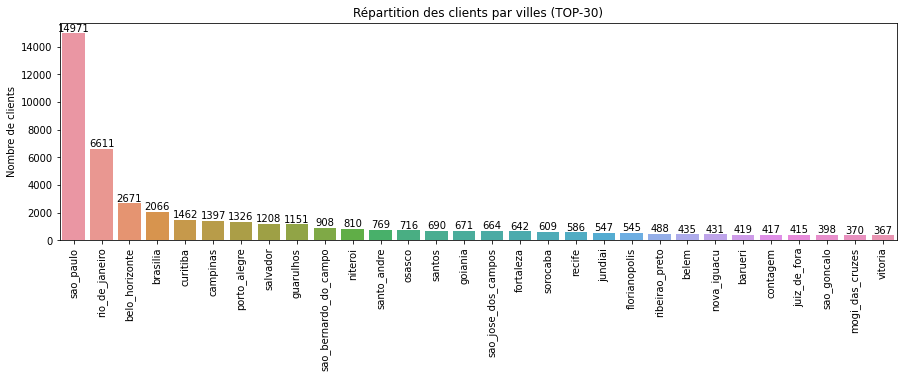

In [45]:
top_size = 30
selection = pd.DataFrame(data_customer_unique.customer_city.value_counts()[:top_size]).T
plot_bars(selection, f"Répartition des clients par villes (TOP-{top_size})", y_label="Nombre de clients")

### Affichons à présent une carte pour se faire une idée plus précise et visuelle de la réparition géographique

In [46]:
left = data_customer_unique.set_index(['customer_zip_code_prefix']).copy()
right = data_geo.set_index(['geolocation_zip_code_prefix']).copy()

data_join_cutomer_geo = left.join(right)
data_join_cutomer_geo.reset_index(inplace=True)
data_join_cutomer_geo.rename(columns={'index': 'customer_zip_code_prefix'}, inplace=True)

# Supprimons les éventuels coordonnées GPS vides
data_join_cutomer_geo.dropna(subset=['geolocation_lat', 'geolocation_lng'], inplace=True)

In [47]:
# Ici on instantie Folium avec des coordonnées de départ et un zoom raisonnable
map_ = folium.Map(location=["-10", "-46"], zoom_start=4, scrollWheelZoom=False)  # width=1100, height=1100, 

# Puis on ajoute chacun des points d'intéret sur notre map
select = data_join_cutomer_geo
map_.add_child(FastMarkerCluster(

        select[["geolocation_lat", "geolocation_lng", "customer_zip_code_prefix", "geolocation_city", "geolocation_state"]].values.tolist(), 
        showCoverageOnHover=True,
        spiderfyOnMaxZoom=False,
        disableClusteringAtZoom=20,
        callback=callback
))

folium.GeoJson(brazil, name="Brazil").add_to(map_)  # , tooltip="Brazil"
# Et on l'affiche
map_

>#### On constate que l'essentiel des clients sont dans la région du Sud-Est *(Sao-Paulo / Rio de Janeiro / ...)*

#### Vérifions combien de commandes ont été passées se situent en dehors des frontières géographiques du Brésil.

>#### On a donc environ 52 clients sur 96000 qui sont visiblement hors des frontières **terrestres** *(et approximatives)* du Brésil.
> - Certains de ces points sont en fait des iles dans les eaux nationales du Brésil.
> - ~~Certains de ces points sont très proches de la frontières et peuvent être comptés en dehors alors qu'ils sont sur le territoire.~~ *(corrigé avec un meilleur GeoJson)*
> - D'autres sont clairement hors du territoire national, mais les clients peuvent être des nationaux malgré tout.
>
> Ils représentent cependant une infime fraction des points géographiques disponibles.

---
>#### `TODO`  done ✅ | todo ❌ |
> - ✅ Dans l'analyse multivariée, regarder le nombre de clients qui passent commande plusieurs fois sur la base de `customer_unique_id` et `customer_id`.<br><u>*(action: fait un peu plus haut dans la section Analyses Multivariées)*</u>
> - ✅ Remplacer les caractères spéciaux dans les noms de villes pour supprimer les problèmes de doublons.<br><u>*(action: fait un peu plus haut dans la section Valeurs uniques)*</u>

In [48]:
data_customer.to_csv('data/olist_customers_dataset_clean.csv', index=False)

---
---
# 3. `olist_orders_dataset.csv` <a class="anchor" id="data_orders"></a> [⇪](#menu)

In [49]:
data_orders.sample(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
70211,d374e958c5246d608c3baeca9ddccb16,c187f9ccfe83b8d98c81b403211cf8c2,delivered,2017-08-12 21:48:34,2017-08-12 22:03:54,2017-08-14 21:15:08,2017-08-21 16:14:06,2017-09-14 00:00:00
81259,59023d9e8757da4a343b81debedb7cd9,06c90f4d3ea938996708090e6d65891a,delivered,2018-02-25 14:06:30,2018-02-25 14:15:29,2018-02-27 17:34:51,2018-03-21 16:21:33,2018-03-26 00:00:00
37822,3f678ace108ecc7c2ffd70470390817b,7ca80fb4959fc6a8e996c4752387fcaf,delivered,2018-02-03 08:46:29,2018-02-06 05:31:52,2018-02-08 22:16:52,2018-02-14 20:48:51,2018-03-02 00:00:00
19336,39986789e9546c96bf9cf93637d3d6c1,0348ea4d0b778a75707cb99aef17ac25,delivered,2017-11-28 22:51:20,2017-11-30 02:20:36,2017-12-04 19:46:07,2017-12-16 12:48:43,2017-12-21 00:00:00
56790,bf109fa36da244c6c5425edfda0d8aab,f1ede9f967d57c8c6e3371225fb5bc3d,delivered,2017-09-08 10:21:17,2017-09-09 05:15:53,2017-09-12 14:56:30,2017-09-21 17:48:28,2017-10-02 00:00:00


>#### Ce jeu de données semble être un élément central pour l'activité d'Olist puisqu'il liste les commandes enregistrées, leur état actual et les dates/heures des différentes étapes du processus.
> - `order_id` est un ID constant pour chaque commande
> - `customer_id` est un ID de session pour un client donné lorsqu'il passe commande
> - `order_status` indique le status actuel de la commande *(delivered / shipped / etc... )*
> - `order_purchase_timestamp` correspond au timestamp de passage d'ordre d'achat
> - `order_approved_at` correspond au timestamp de la confirmation de payement par la banque
> - `order_delivered_carrier_date` correspond au timestamp de remise du colis à l'entreprise de livraison
> - `order_delivered_customer_date` correspond au timestamp de remise du colis au client
> - `order_estimated_delivery_date` correspond au timestamp de la date de livraison indiquée au moment de la commande

In [50]:
print_dataset_shape(data_orders)

Ce dataset contient 99441 entrées décrites par 8 variables


## 3.1 Vérifications de base <a class="anchor" id="data_orders_checks"></a> [⇪](#menu)

In [51]:
data_orders.describe().T

,count,unique,top,freq
order_id,99441,99441,e481f51cbdc54678b7cc49136f2d6af7,1
customer_id,99441,99441,9ef432eb6251297304e76186b10a928d,1
order_status,99441,8,delivered,96478
order_purchase_timestamp,99441,98875,2018-04-11 10:48:14,3
order_approved_at,99281,90733,2018-02-27 04:31:10,9
order_delivered_carrier_date,97658,81018,2018-05-09 15:48:00,47
order_delivered_customer_date,96476,95664,2018-05-08 23:38:46,3
order_estimated_delivery_date,99441,459,2017-12-20 00:00:00,522


### Valeurs manquantes

In [52]:
_ = print_fill_rate(data_orders, data_orders.columns)

                  COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
                     order_id |               0 |          100.00%
                  customer_id |               0 |          100.00%
                 order_status |               0 |          100.00%
     order_purchase_timestamp |               0 |          100.00%
            order_approved_at |             160 |           99.84%
 order_delivered_carrier_date |            1783 |           98.21%
order_delivered_customer_date |            2965 |           97.02%
order_estimated_delivery_date |               0 |          100.00%


#### Vérifions si les `order_delivered_carrier_date` vides sont également des `order_delivered_customer_date` vides.

In [53]:
data_orders[
    (data_orders.order_delivered_carrier_date.isnull()) & 
    (data_orders.order_delivered_customer_date.isnull())
].shape

(1782, 8)

>#### Une toute petite fraction des commandes ne dispose pas des dates de validation *(order_approved_at)*, des dates d'envoi *(order_delivered_carrier_date)* ou des dates de réception *(order_delivered_customer_date)*
>
> - **160** sont probablement des **commandes avortées** faute de confirmation/validation par la banque.
> - **1783** n'ont pas de dates de remive à la compagnie de livraison et 1782 d'entre elles n'ont pas non plus de date de remise au client... ce sont certainement des colis **jamais envoyés ni livrés**.
> - **1183** *(2965-1782)* n'ont pas de date de remise au client et pourraient être des **colis égarés / volés ou pas enregistrés** en raison d'un problème technique.
> 
> Etant donné la nature des colonnes concernées et le nombre de lignes impliquées, le plus approprié semble être de les supprimer SI l'on a besoin des colonnes en question.

### Valeurs uniques

In [54]:
data_orders.nunique()

order_id                         99441
customer_id                      99441
order_status                         8
order_purchase_timestamp         98875
order_approved_at                90733
order_delivered_carrier_date     81018
order_delivered_customer_date    95664
order_estimated_delivery_date      459
dtype: int64

>#### On constate qu'il y a exactement le même nombre d'`order_id` que de `customer_id`.
> Donc chaque ID de session correspond à une et une seule commande.
>
> Le fait que les timestamps soient parfois identiques n'a rien de surprenant sur un site à gros traffic; il arrive que plusieurs actions identiques surviennent au même moment.

#### Regardons plus en détails les valeurs de l'unique colonne catégorielle

In [55]:
print_unique(data_orders, ['order_status'])

order_status        
['delivered' 'invoiced' 'shipped' 'processing' 'unavailable' 'canceled'
 'created' 'approved']



>#### Les labels des status sont propres

#### Regardons quels sont les intervalles de temps concernés par les differentes variables temporelles

In [56]:
date_cols = [
    'order_purchase_timestamp',
    'order_approved_at',
    'order_delivered_carrier_date',
    'order_delivered_customer_date',
    'order_estimated_delivery_date',
]
check_dates(data_orders, date_cols)

order_purchase_timestamp       : FROM  2016-09-04 21:15:19  TO  2018-10-17 17:30:18
order_approved_at              : FROM  2016-09-15 12:16:38  TO  2018-09-03 17:40:06
order_delivered_carrier_date   : FROM  2016-10-08 10:34:01  TO  2018-09-11 19:48:28
order_delivered_customer_date  : FROM  2016-10-11 13:46:32  TO  2018-10-17 13:22:46
order_estimated_delivery_date  : FROM  2016-09-30 00:00:00  TO  2018-11-12 00:00:00


>#### On a donc des commandes qui s'étalent sur **2 ans** entre Septembre/Octobre 2016 et Octobre/Novembre 2018

### Doublons

#### Regardons si il y des commandes en double sur la base de la colonne ID `order_id`

In [57]:
data_orders.duplicated(subset=['order_id']).sum()

0

>#### Il y a donc visiblement aucun doublon.

## 3.2 Analyses multivariées <a class="anchor" id="data_orders_multi"></a> [⇪](#menu)

### Regardons la repartition des commandes dans le temps

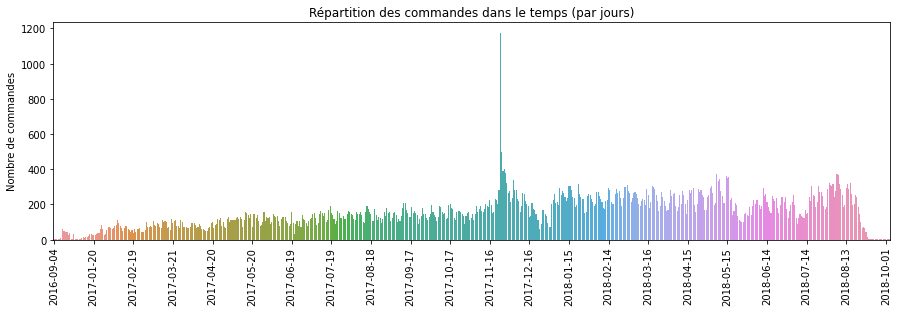

In [58]:
selection = data_orders[['order_id', 'order_purchase_timestamp']].copy()
selection['short_date'] = selection.order_purchase_timestamp.apply(lambda x: x[:10])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T
    
plot_bars(selection, "Répartition des commandes dans le temps (par jours)", labels_modulo=30, show_values=False)

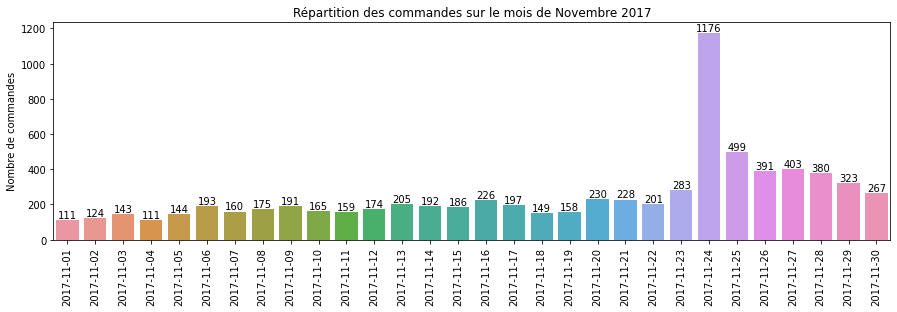

In [59]:
selection = data_orders[
        (data_orders['order_purchase_timestamp'] > '2017-11-01 00:00:00') &
        (data_orders['order_purchase_timestamp'] < '2017-12-01 00:00:00')
    ][['order_id', 'order_purchase_timestamp']].copy()

selection['short_date'] = selection.order_purchase_timestamp.apply(lambda x: x[:10])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T

plot_bars(selection, "Répartition des commandes sur le mois de Novembre 2017")

>#### On constate une montrée progressive du nombre de commandes dans le temps.
> Par ailleurs on note un pique courant Novembre 2017 *(en particulier le 24, mais les 5 jours suivants restent très au dessus de la moyenne)*

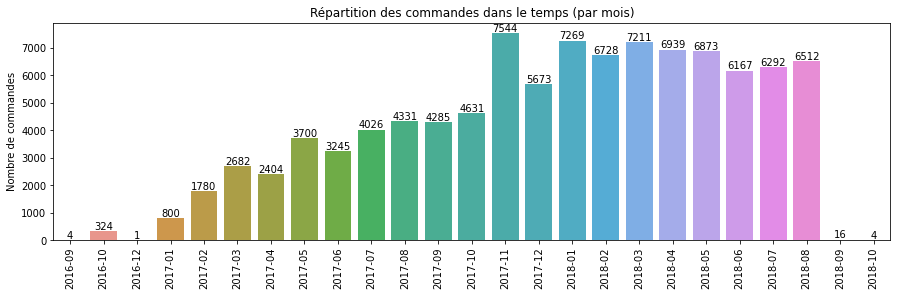

In [60]:
selection = data_orders[['order_id', 'order_purchase_timestamp']].copy()
selection['short_date'] = selection.order_purchase_timestamp.apply(lambda x: x[:7])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T

plot_bars(selection, "Répartition des commandes dans le temps (par mois)")

>#### On constate que les deux extrêmitées de ce graphique sont révélatrices de données peu exploitables.
> - A gauche, les commandes ne commencent vraiment qu'en Janvier/Fevrier 2017  bien que les données commencent en Septembre 2016.
> - A droit, les commandes cessent en Aout 2018 bien que les données aillent jusqu'en octobre.

### Regardons la repartition **moyenne** des commandes dans le temps

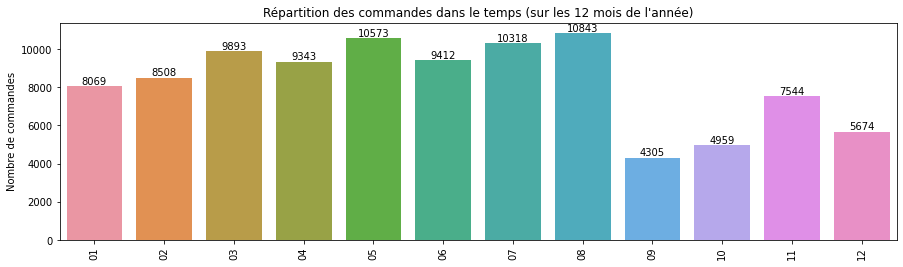

In [61]:
selection = data_orders[['order_id', 'order_purchase_timestamp']].copy()
selection['short_date'] = selection.order_purchase_timestamp.apply(lambda x: x[5:7])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T

plot_bars(selection, "Répartition des commandes dans le temps (sur les 12 mois de l'année)")

>#### Les 4 derniers mois de l'année sont très en dessous des autres mois de l'année, mais c'est très certainement lié au fait que:
> - les commandes ne commencent vraiment qu'en Janvier/Fevrier 2017 
> - les commandes cessent en Aout 2018

### Regardons la repartition **moyenne** des commandes en fonction des jours de la semaine

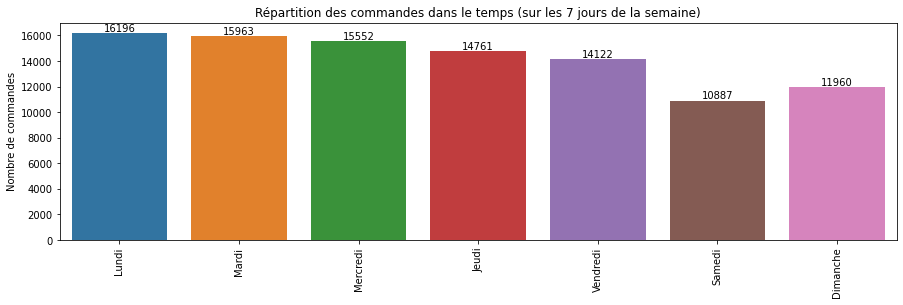

In [62]:
days_names = {0: 'Lundi', 1: 'Mardi', 2: 'Mercredi', 3: 'Jeudi', 4: 'Vendredi', 5: 'Samedi', 6: 'Dimanche'}

selection = data_orders[['order_id', 'order_purchase_timestamp']].copy()
selection['short_date'] = selection.order_purchase_timestamp.apply(lambda x: days_names[datetime.datetime.strptime(x[:10], '%Y-%m-%d').weekday()])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T
selection = selection[[*days_names.values()]]

plot_bars(selection, "Répartition des commandes dans le temps (sur les 7 jours de la semaine)")

>#### On constate que le climax du nombre de commandes moyennes est le Lundi et que ça descend progressivement jusqu'au week-end qui est nettement plus marqué.

### Regardons à présent la répartition des status de commandes

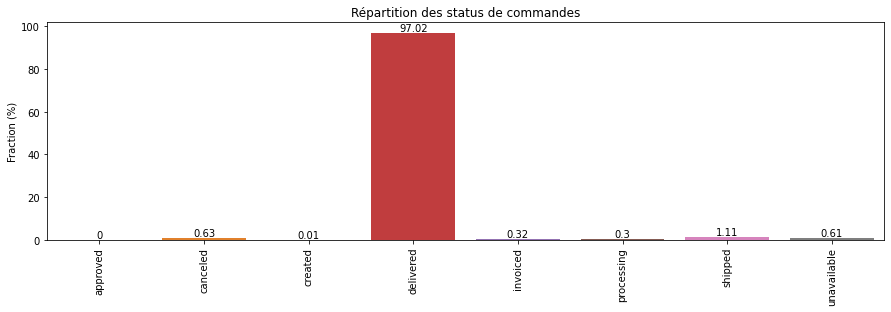

In [63]:
selection = pd.DataFrame(round(data_orders.groupby('order_status').size()/data_orders.shape[0]*100,2)).T
plot_bars(selection, "Répartition des status de commandes", y_label="Fraction (%)")

>#### On constate que:
> - il y a 5 status transitoires *(approved > created > invoiced > processing > shipped)*
> - il y a 3 status finaux *(canceled, delivered, unavailable)*
> - l'énorme majoritée *(97%)* des commandes ont été livrées (ce qui est logique puisque c'est le status final escompté)
> - environ 1.75% sont dans un status transitoire

### Regardons les délais de livraison

In [64]:
def convert_time(x):
    if str(x) == 'nan':
        return None
    else:
        #print(x, type(x))
        return datetime.datetime.strptime(str(x)[:10], '%Y-%m-%d')


selection = data_orders[['order_id', 'order_purchase_timestamp', 'order_delivered_customer_date']].copy()
selection['order_purchase_timestamp'] = selection['order_purchase_timestamp'].apply(convert_time)
selection['order_delivered_customer_date'] = selection['order_delivered_customer_date'].apply(convert_time)
data_orders['delivery_days'] = selection['order_delivered_customer_date'] - selection['order_purchase_timestamp']
data_orders['delivery_days'] = data_orders['delivery_days'].apply(lambda x: x.days)
data_orders.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,14.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,9.0


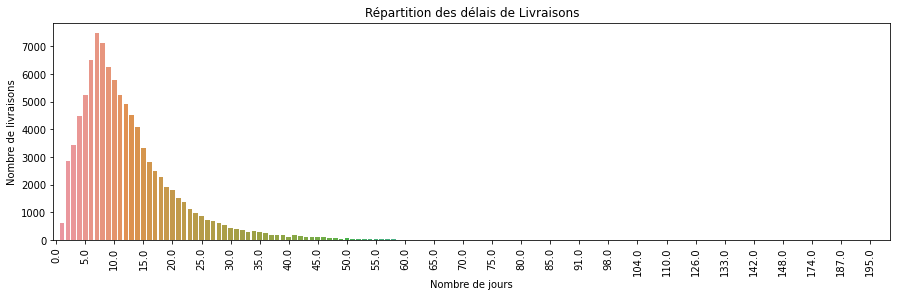

In [65]:
selection = pd.DataFrame(data_orders.groupby('delivery_days').size(), columns=['count']).T
plot_bars(selection, "Répartition des délais de Livraisons", y_label='Nombre de livraisons', x_label="Nombre de jours", labels_modulo=5, show_values=False)

In [66]:
selection

delivery_days,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,186.0,187.0,188.0,190.0,191.0,194.0,195.0,196.0,208.0,210.0
count,1,629,2874,3448,4497,5258,6507,7482,7123,6256,...,1,1,2,1,1,1,2,1,1,1


>#### On constate que:
> - la quasi totalité des livraisons surviennent sous 30 à 40 jours
> - certaines livraisons peuvent prendre jusqu'à 6 mois après la commande...

---
>#### `TODO`  done ✅ | todo ❌ |
> - ❌ **supprimer** les entrées dont les dates *(order_approved_at, order_delivered_carrier_date, order_delivered_customer_date)* ne sont pas connues **SI** on a besoin des dates en question...
> - ❌ **traiter** le pic du 24/11/2017 et les 5 jours suivants comme une valeur atypique.
> - ❌ **exclure** les données avant Janvier 2017 et après Aout 2018 si l'on veut étudier le **data drift**

In [67]:
data_orders.to_csv('data/olist_orders_dataset_clean.csv', index=False)

---
---
# 4. `olist_order_items_dataset.csv` <a class="anchor" id="data_items"></a> [⇪](#menu)

In [68]:
data_items.sample(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
47087,6affff7ca93622555a65d2d9a169070f,1,3e5201fe0d1ba474d9b90152c83c706c,8160255418d5aaa7dbdc9f4c64ebda44,2018-04-13 14:10:26,125.90,19.85
22096,327cce1fcc02fedef63c30dbde323402,1,c413fa08b405af6edb9d49e85e241c08,b76dba6c951ab00dc4edf0a1aa88037e,2017-05-11 02:23:05,12.97,24.84
3059,06debbd4d40f6d36dc28c4f7dc647c1b,1,5b3b5f9ae84ca9ead3138b199420cc94,adbc26658d6c7b4b6219f9d934598091,2018-04-09 21:30:20,129.90,18.49
60322,897d07de9354c8089f538f825f4330fb,1,65e52a3d3ad102e0308bfde7c1424a89,4830e40640734fc1c52cd21127c341d4,2018-04-20 14:31:09,19.99,13.71
15369,230c4b870a8eec405f6b5db505974701,1,bfebe3af6798e21f14c80263db86b7a0,a888faf2d1baececa6baf9c3d603ee1f,2017-04-10 22:55:19,313.90,16.37


>#### On a un dataset permet de connaitre la liste des produits **unitaires** appartenant à une commande donnée.
> - `order_id` est l'ID de la commande associée *(c'est l'ID du panier)*
> - `order_item_id` est la position du produit dans le panier *(X fois le même produit = X lignes dans cette table)*
> - `product_id` est l'ID du produit commandé et que l'on retrouve dans le jeu de données `olist_products_dataset.csv`
> - `seller_id` est l'ID du fournisseur et que l'on retrouve dans le jeu de données `olist_sellers_dataset.csv`
> - `shipping_limit_date` indique la date limite à laquelle le produit doit être remis à la société de livraison
> - `price` indique le prix de vente du produit
> - `freight_value` indique le montant des frais de ports *(par produit)*

In [69]:
print_dataset_shape(data_items)

Ce dataset contient 112650 entrées décrites par 7 variables


## 4.1 Vérifications de base <a class="anchor" id="data_items_checks"></a> [⇪](#menu)

### Analyses Univariées (avec Voila)

----- UNIVARIATE ANALYSIS for "order_item_id" -----

count    112650.000000
mean          1.197834
std           0.705124
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          21.000000
Name: order_item_id, dtype: float64




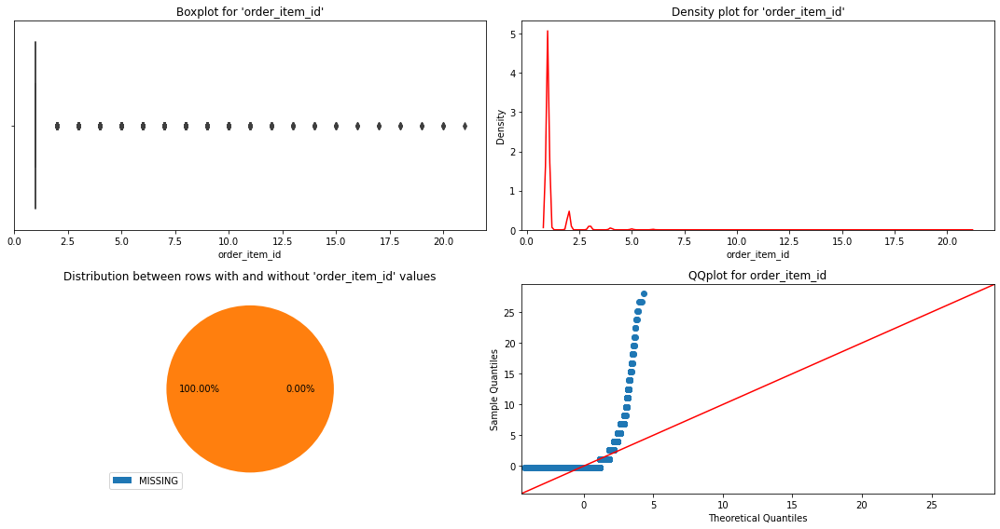

'order_item_id' is missing 0 over 112650 (0.00%)


<function __main__.select_quantitative4(column_name)>

In [70]:
vars_numericals4 = data_items.select_dtypes(include='number').columns
data_interact_quanti4 = data_items[vars_numericals4].copy()  # .sample(frac=0.1)


def select_quantitative4(column_name):
    explore_quantitative(data_interact_quanti4, column_name)


interact(select_quantitative4, column_name=vars_numericals4)

In [71]:
data_items.describe().T

,count,mean,std,min,25%,50%,75%,max
order_item_id,112650.0,1.197834,0.705124,1.00,1.00,1.00,1.00,21.00
price,112650.0,120.653739,183.633928,0.85,39.90,74.99,134.90,6735.00
freight_value,112650.0,19.990320,15.806405,0.00,13.08,16.26,21.15,409.68


>#### Les valeurs numériques semblent cohérentes
> - la quantité de produits vont de 1 à 21; ce qui est parfaitement sensé.
> - les prix oscillent *(en réal brésilien)* entre 0.85 et 6735; ce qui semble OK.
> - les frais de ports oscillent entre 0 et 409; ce qui semble là encore acceptable

In [72]:
data_items.describe(exclude='number').T

,count,unique,top,freq
order_id,112650,98666,8272b63d03f5f79c56e9e4120aec44ef,21
product_id,112650,32951,aca2eb7d00ea1a7b8ebd4e68314663af,527
seller_id,112650,3095,6560211a19b47992c3666cc44a7e94c0,2033
shipping_limit_date,112650,93318,2017-07-21 18:25:23,21


>#### Les valeurs non-numériques semblent cohérentes

### Valeurs manquantes

In [73]:
_ = print_fill_rate(data_items, data_items.columns)

        COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
           order_id |               0 |          100.00%
      order_item_id |               0 |          100.00%
         product_id |               0 |          100.00%
          seller_id |               0 |          100.00%
shipping_limit_date |               0 |          100.00%
              price |               0 |          100.00%
      freight_value |               0 |          100.00%


> Aucune valeur n'est manquante

### Valeurs uniques

In [74]:
data_items.nunique()

order_id               98666
order_item_id             21
product_id             32951
seller_id               3095
shipping_limit_date    93318
price                   5968
freight_value           6999
dtype: int64

>#### On constate que:
> - les 32951 produits disponibles dans `olist_products_dataset.csv`, ont tous été commandés au moins une fois.
> - les 3095 fournisseurs disponibles dans `olist_sellers_dataset.csv`, ont tous vendu au moins 1 produit.
> - en revanche seuls 98666 des 99441 commandes référencées dans `olist_orders_dataset.csv` sont présents dans ce jeu de données.

#### Regardons quels sont les intervalles de temps concernés par les differentes variables temporelles

In [75]:
check_dates(data_items, ['shipping_limit_date'])

shipping_limit_date            : FROM  2016-09-19 00:15:34  TO  2020-04-09 22:35:08


> On note des dates de livraison allant jusqu'à **2020** alors que l'on a vu dans le jeu de données `olist_orders_dataset.csv` que les dernières commandes ont été réalisées en 2018.

### Doublons

#### Regardons si il y des commandes en double sur la base des colonnes `order_id` et `product_id`

In [76]:
data_items.duplicated(subset=['order_id', 'product_id']).sum()

10225

>#### On a donc environ 10000 doublons, mais ce n'est **pas une anomalie**;
> chaque ligne associant un unique produit *(produit, PAS type de produit)* à une commande, il faut plusieurs lignes pour un panier de plusieurs produits même si c'est plusieurs fois le même produit.

#### Vérifions donc si il y a des doublons en incluant `order_item_id`

In [77]:
data_items.duplicated(subset=['order_id', 'order_item_id', 'product_id']).sum()

0

>#### Il y a donc visiblement aucun doublon.

## 4.2 Analyses multivariées <a class="anchor" id="data_items_multi"></a> [⇪](#menu)

### Regardons les produits les plus vendus

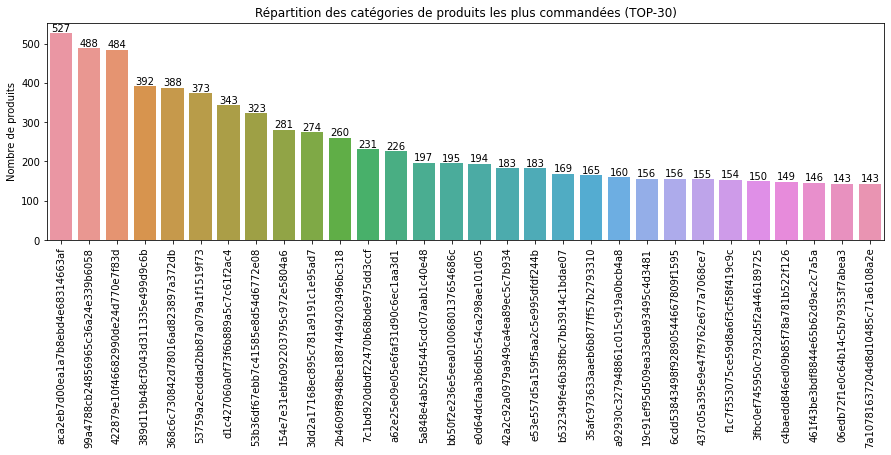

In [78]:
top_size = 30
selection = pd.DataFrame(data_items.product_id.value_counts()[:top_size]).T
plot_bars(selection, f"Répartition des catégories de produits les plus commandées (TOP-{top_size})", y_label="Nombre de produits")

>#### Il est difficile de se faire une idée de ce que ça represente puisque les noms de produits ont été anonymisés.
> En revanche, nous pourrions utiliser les noms de catégories associés pour se faire malgré tout une idée des produits les plus vendus...

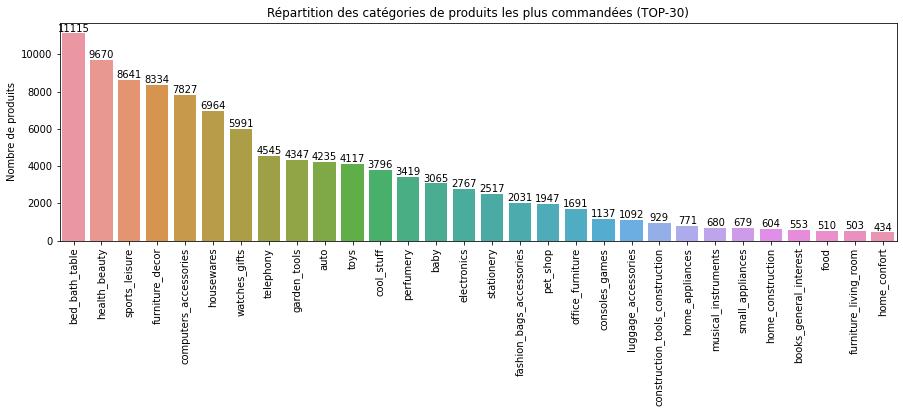

In [79]:
top_size = 30

# Je fais une table temporaire qui remplace les product_id par les product_category_name (car on a pas les noms des produits)
data_tmp = data_items[['order_id', 'product_id']].copy()
data_tmp = data_tmp.merge(data_products, on='product_id', how='left')[['order_id', 'product_category_name']]
# puis j'ajoute les noms des catégories en anglais pour que ce soit plus facile à interpréter
data_tmp = data_tmp.merge(data_categories, on='product_category_name', how='left')
selection = pd.DataFrame(data_tmp.product_category_name_english.value_counts()[:top_size]).T

plot_bars(selection, f"Répartition des catégories de produits les plus commandées (TOP-{top_size})", y_label="Nombre de produits")

>#### On constate que les catégories de produits les plus commandées sont:
> 1. `cama_mesa_banho | bed_bath_table`: du linge de maison - environ **10% des ventes**.
> 2. `beleza_saude | health_beauty`: des produits de beauté et de santé - environ **8.5% des ventes**
> 3. `esporte_lazer | sports_leisure`: des produits de loisirs sportifs - environ **7.7% des ventes**
> 4. `movies_decoracao | furniture_decor`: des décorations de films - environ **7.4% des ventes**
> 5. `informatica_acessorios | computers_accessories`: des accessoires informatiques - environ **7% des ventes**
> 6. `utilidades_domesticas | housewares`: des appareils ménagers - environ **6.2% des ventes**
> 7. `relogios_presentes | watches_gifts`: des montres à offrir - environ **5.3% des ventes**
> 8. `telefonia | telephony`: des produits liés à la téléphonie - environ **4% des ventes**
> 9. `ferramentas_jardin | garden_tools`: des outils de jardinage - environ **3.9% des ventes**
> 10. Ces 9 catégories représentent donc 60% des ventes et les `AUTRES` environ **40%**

### Regardons comment se répartissent les date limite de livraison dans le temps

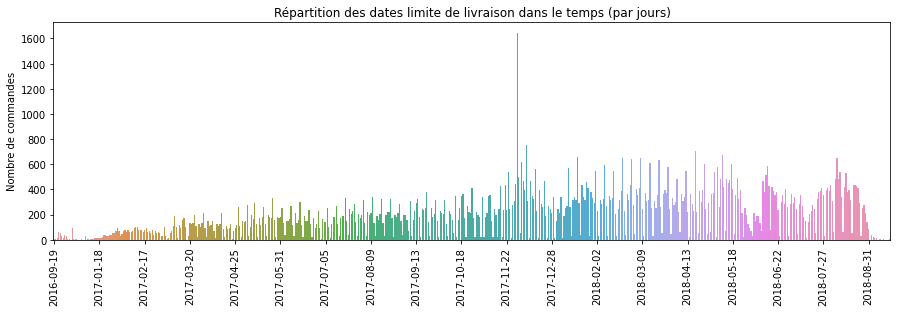

In [80]:
selection = data_items[['shipping_limit_date']].copy()
selection['short_date'] = selection.shipping_limit_date.apply(lambda x: x[:10])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T
plot_bars(selection, "Répartition des dates limite de livraison dans le temps (par jours)", labels_modulo=30, show_values=False)

>#### Ce graphique correspond assez fidèlement à celui de la répartition des commandes dans le temps...
> Donc le fait que l'on ai trouvé des dates jusqu'en 2020 montre qu'il y a clairement des outliers à supprimer.

In [81]:
data_items[(data_items.shipping_limit_date < '2016-09-01 00:00:00') | (data_items.shipping_limit_date > '2018-12-01 00:00:00')]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
8643,13bdf405f961a6deec817d817f5c6624,1,96ea060e41bdecc64e2de00b97068975,7a241947449cc45dbfda4f9d0798d9d0,2020-02-05 03:30:51,69.99,14.66
68516,9c94a4ea2f7876660fa6f1b59b69c8e6,1,282b126b2354516c5f400154398f616d,7a241947449cc45dbfda4f9d0798d9d0,2020-02-03 20:23:22,75.99,14.70
85729,c2bb89b5c1dd978d507284be78a04cb2,1,87b92e06b320e803d334ac23966c80b1,7a241947449cc45dbfda4f9d0798d9d0,2020-04-09 22:35:08,99.99,61.44
85730,c2bb89b5c1dd978d507284be78a04cb2,2,87b92e06b320e803d334ac23966c80b1,7a241947449cc45dbfda4f9d0798d9d0,2020-04-09 22:35:08,99.99,61.44


>#### En effet on a 4 dates qui se placent longtemps après les dernières commandes
> Il convient de les supprimer, car ces lignes ont peut être d'autres informations fausses.

In [82]:
data_items = data_items[data_items.shipping_limit_date < '2018-12-01 00:00:00']
data_items.shape

(112646, 7)

### Regardons le nombre d'articles commandés par commandes

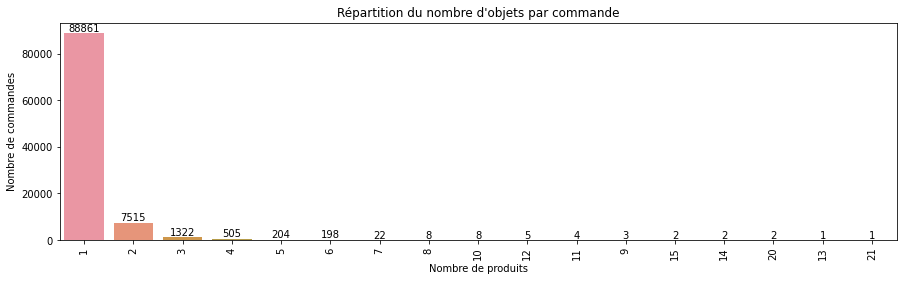

In [83]:
selection = pd.DataFrame(data_items.groupby('order_id').last().order_item_id.value_counts()).T
plot_bars(selection, "Répartition du nombre d'objets par commande", x_label="Nombre de produits", y_label="Nombre de commandes")

>#### On constate que:
> - l'énorme majorité des commandes ne contiennent en réalité qu'un seul produit

---
>#### `TODO`  done ✅ | todo ❌ |
> - ✅ **Remove outliers** based on the `shipping_limit_date`<br><u>*(action: c'est fait juste au dessus et exporté ci-dessous, mais ça ne s'applique pas sur les analyses faites plus haut avec les colonnes de ce jeu de données)*</u>

In [84]:
data_items.to_csv('data/olist_order_items_dataset_clean.csv', index=False)

---
---
# 5. `olist_products_dataset.csv` <a class="anchor" id="data_products"></a> [⇪](#menu)

In [85]:
data_products.sample(5)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
4974,eb40735d540d6ccdfb0b74782ba065dc,relogios_presentes,38.0,223.0,3.0,700.0,19.0,9.0,15.0
3048,7cefa61c9500d9b227894dc48d8b5a0b,utilidades_domesticas,54.0,544.0,1.0,300.0,25.0,10.0,36.0
31247,f0978bc4bcd57a1f2079015178b73cad,esporte_lazer,58.0,1275.0,2.0,700.0,20.0,30.0,30.0
6564,176b5cf1bc33d549356b072323692f0f,beleza_saude,24.0,1208.0,2.0,761.0,28.0,13.0,20.0
10040,635c4d1abbc47f87a51cec367caeccdf,fashion_bolsas_e_acessorios,52.0,566.0,1.0,100.0,22.0,2.0,19.0


>#### On a un dataset qui décrit les produits disponibles sur Olist par différentes caractèristiques
> - `product_id` est l'ID du produit et que l'on retrouve dans le jeu de données `olist_order_items_dataset.csv`
> - `product_category_name` est le nom de la catégories dont dépend le produit *(en Portugais)*
> - `product_name_lenght` est le nombre de caractères dans le nom du produit
> - `product_description_lenght` est le nombre de caractères dans la description du produit
> - `product_photos_qty` est nombre de photos de produit affichées sur sa page produit
> - `product_weight_g` est le poids du produit en grammes
> - `product_length_cm` est la longueur du produit en cm
> - `product_height_cm` est la hauteur du produit en cm
> - `product_width_cm` est la largeur du produit en cm

In [86]:
print_dataset_shape(data_products)

Ce dataset contient 32951 entrées décrites par 9 variables


## 5.1 Vérifications de base <a class="anchor" id="data_products_checks"></a> [⇪](#menu)

### Analyses Univariées (avec Voila)

----- UNIVARIATE ANALYSIS for "product_name_lenght" -----

count    32341.000000
mean        48.476949
std         10.245741
min          5.000000
25%         42.000000
50%         51.000000
75%         57.000000
max         76.000000
Name: product_name_lenght, dtype: float64




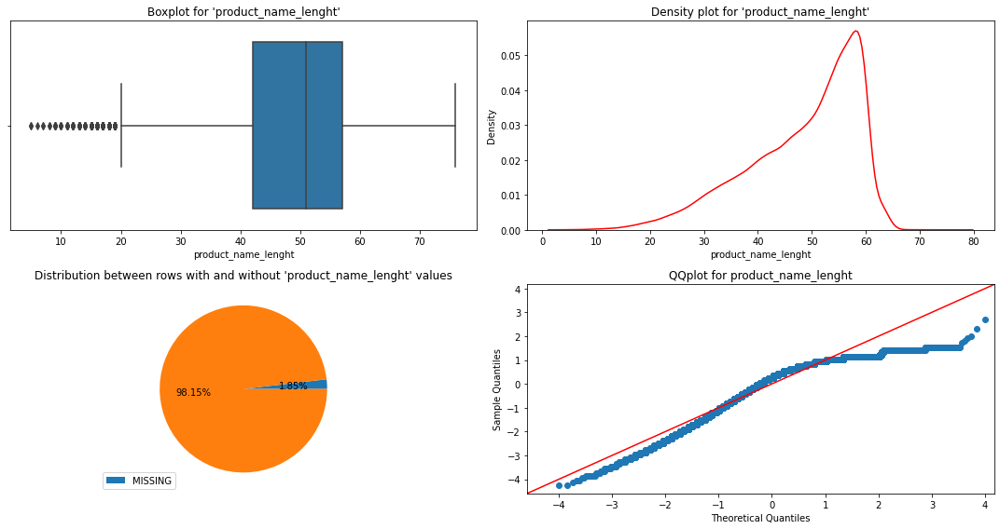

'product_name_lenght' is missing 610 over 32951 (1.85%)


<function __main__.select_quantitative5(column_name)>

In [87]:
vars_numericals5 = data_products.select_dtypes(include='number').columns
data_interact_quanti5 = data_products[vars_numericals5].copy()  # .sample(frac=0.1)


def select_quantitative5(column_name):
    explore_quantitative(data_interact_quanti5, column_name)


interact(select_quantitative5, column_name=vars_numericals5)

In [88]:
data_products.describe().T

,count,mean,std,min,25%,50%,75%,max
product_name_lenght,32341.0,48.476949,10.245741,5.0,42.0,51.0,57.0,76.0
product_description_lenght,32341.0,771.495285,635.115225,4.0,339.0,595.0,972.0,3992.0
product_photos_qty,32341.0,2.188986,1.736766,1.0,1.0,1.0,3.0,20.0
product_weight_g,32949.0,2276.472488,4282.038731,0.0,300.0,700.0,1900.0,40425.0
product_length_cm,32949.0,30.815078,16.914458,7.0,18.0,25.0,38.0,105.0
product_height_cm,32949.0,16.937661,13.637554,2.0,8.0,13.0,21.0,105.0
product_width_cm,32949.0,23.196728,12.079047,6.0,15.0,20.0,30.0,118.0


>#### La plupart des valeurs numériques semblent cohérentes
> - les nom de produits oscillent entre 5 et 76 caractères; ce qui semble OK.
> - les descriptions vont de 4 à 3992 caractères; ce qui semble acceptable même si 4 c'est un peu court...
> - le nombre de photos se situe entre 1 et 20; ce qui est cohérent.
> - la longeur va de 7 à 105; ce qui semble OK.
> - la hauteur va de 2 à 105; ce qui semble OK.
> - la largeur va de 6 à 118; ce qui semble OK.

> #### Cependant, on constate qu'il pourrait y avoir quelques valeurs abérrantes:
> - le poids des produits va de 0 à 40425; ce qui pose un problème puisque le minimum est de 0.

In [89]:
data_products[data_products.product_weight_g <= 0]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
9769,81781c0fed9fe1ad6e8c81fca1e1cb08,cama_mesa_banho,51.0,529.0,1.0,0.0,30.0,25.0,30.0
13683,8038040ee2a71048d4bdbbdc985b69ab,cama_mesa_banho,48.0,528.0,1.0,0.0,30.0,25.0,30.0
14997,36ba42dd187055e1fbe943b2d11430ca,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
32079,e673e90efa65a5409ff4196c038bb5af,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0


>#### En effet on a 4 produits tous classés dans la catégorie des linges de maison qui ont un poids nul
> Mais en regardant de plus près les caractèristiques, on peut supposer que ce sont des mouchoirs de poche et que le vendeur à considéré le poids comme tellement négligeable qu'il a mis 0... On pourrait les supprimer, mais les garder ne devrait avoir aucune conséquence.

### Valeurs manquantes

In [90]:
_ = print_fill_rate(data_products, data_products.columns)

               COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
                product_id |               0 |          100.00%
     product_category_name |             610 |           98.15%
       product_name_lenght |             610 |           98.15%
product_description_lenght |             610 |           98.15%
        product_photos_qty |             610 |           98.15%
          product_weight_g |               2 |           99.99%
         product_length_cm |               2 |           99.99%
         product_height_cm |               2 |           99.99%
          product_width_cm |               2 |           99.99%


>#### On constate que:
> - Une petite fraction des produits ne dispose de toutes les données <br>*(`product_category_name`, `product_name_lenght`, `product_description_lenght`, `product_photos_qty`)*.
>
> Nous pourrions essayer d'imputer les valeurs manquantes, mais étant donné la nature des colonnes concernées, il semble hasardeux de le faire sur la base des autres colonnes... Donc étant donné le nombre de produits concernés, le plus simple est de les supprimer SI l'on souhaite utiliser ces colonnes.

### Valeurs uniques

In [91]:
data_products.nunique()

product_id                    32951
product_category_name            73
product_name_lenght              66
product_description_lenght     2960
product_photos_qty               19
product_weight_g               2204
product_length_cm                99
product_height_cm               102
product_width_cm                 95
dtype: int64


>#### On constate que:
> - il y a **32951 produits** dans le catalogue Olist
> - il y a **73 catégories** de produits distinctes

### Doublons

#### Regardons si il y des produits en double sur la base de la colonne `product_id`

In [92]:
data_products.duplicated(subset=['product_id']).sum()

0

>#### Il y a donc visiblement aucun doublon.

## 5.2 Analyses multivariées <a class="anchor" id="data_products_multi"></a> [⇪](#menu)

### Regardons les catégories de produits les plus présentes

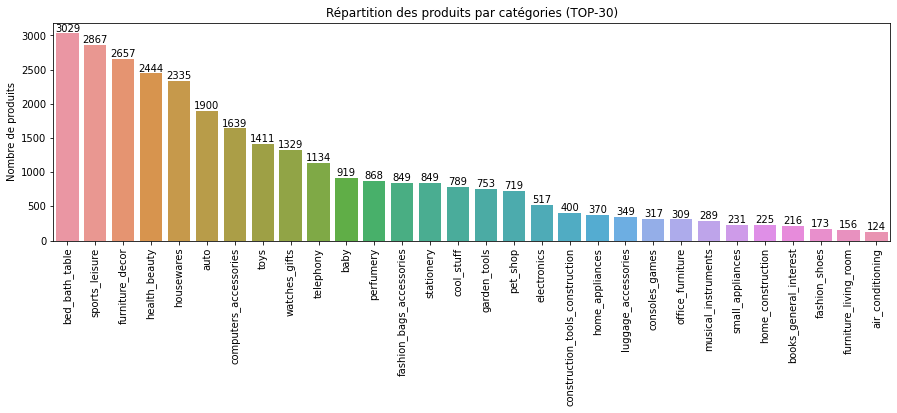

In [93]:
top_size = 30

data_tmp = data_products[['product_id', 'product_category_name']].copy()
data_tmp = data_tmp.merge(data_categories, on='product_category_name', how='left')
selection = pd.DataFrame(data_tmp.product_category_name_english.value_counts()[:top_size]).T

plot_bars(selection, f"Répartition des produits par catégories (TOP-{top_size})", y_label="Nombre de produits")

>#### On constate que les catégories de produits les plus commandées sont:
> 1. `cama_mesa_banho | bed_bath_table`: du linge de maison - environ **9% des produits listés** (pour 10% des ventes).
> 2. `esporte_lazer | sports_leisure`: des produits de loisirs sportifs - environ **8.7% des produits listés** (pour 7.7% des ventes).
> 3. `movies_decoracao | furniture_decor`: des décorations de films - environ **8.1% des produits listés** (pour 7.4% des ventes).
> 4. `beleza_saude | health_beauty`: des produits de beauté et de santé - environ **7.4% des produits listés** (pour 8.5% des ventes).
> 5. `utilidades_domesticas | housewares`: des appareils ménagers - environ **7.1% des produits listés** (pour 6.2% des ventes).
> 6. ++ `automotivo | auto`: des accessoires automobiles - environ **5.8% des produits listés**.
> 7. `informatica_acessorios | computers_accessories`: des accessoires informatiques - environ **5%  des produits listés** (pour 7% des ventes).
> 8. ++ `brinquedos | toys`: des jouets - environ **4.3% des produits listés**.
> 9. `relogios_presentes | watches_gifts`: des montres à offrir - environ **4% des produits listés** (pour 5.3% des ventes).
> 10. Ces 9 catégories représentent donc environ 60% des produits listés et les `AUTRES` environ **40%**

> Même si l'on retrouve bien 7 des 9 catégories des produits les plus vendus, l'ordre n'est pas du tout le même *(sauf le linge de maison qui reste 1er dans les deux cas)*

---
>#### `TODO`  done ✅ | todo ❌ |
> - ❌ **supprimer** les entrées dont les valeurs sont manquantes SI on veut utiliser les colonnes concernées *(`product_category_name`, `product_name_lenght`, `product_description_lenght`, `product_photos_qty`)*.
>

In [94]:
# data_products.to_csv('data/olist_products_dataset_clean.csv', index=False)

---
---
# 6. `olist_order_payments_dataset.csv` <a class="anchor" id="data_payments"></a> [⇪](#menu)

In [95]:
data_payments.sample(5)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
85534,346ffefd56ff0691db147f471af8a1dc,1,credit_card,1,71.15
57851,4013e92991ac3a8e8dd249db406f2a80,1,credit_card,1,26.69
31497,416947793fcfcfdb8304c26bc40fcb67,1,credit_card,2,23.88
11140,e04cf90ef64b387df946d2ddf4542605,1,credit_card,5,52.57
11433,237037d23ef38af0bc36cc20fa48da43,1,debit_card,1,38.72


>#### On a un dataset qui décrit les réglements effectués *(plusieurs moyens de paiement peuvent être associés pour régler une même commande)*
> - `order_id` est l'ID de la commande associée à ce paiement
> - `payment_sequential` est l'ordre des différents paiements si le client à combiné plusieurs moyens de paiement (carte + bons d'achats + ...)
> - `payment_type` est le type de paiement associé utilisé pour cette fraction de la transaction.
> - `payment_installments` est le nombre de versements pour régler ce montant
> - `payment_value` est le montant payé avec ce moyen de paiement

In [96]:
print_dataset_shape(data_payments)

Ce dataset contient 103886 entrées décrites par 5 variables


## 6.1 Vérifications de base <a class="anchor" id="data_payments_checks"></a> [⇪](#menu)

### Analyses Univariées (avec Voila)

----- UNIVARIATE ANALYSIS for "payment_sequential" -----

count    103886.000000
mean          1.092679
std           0.706584
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          29.000000
Name: payment_sequential, dtype: float64




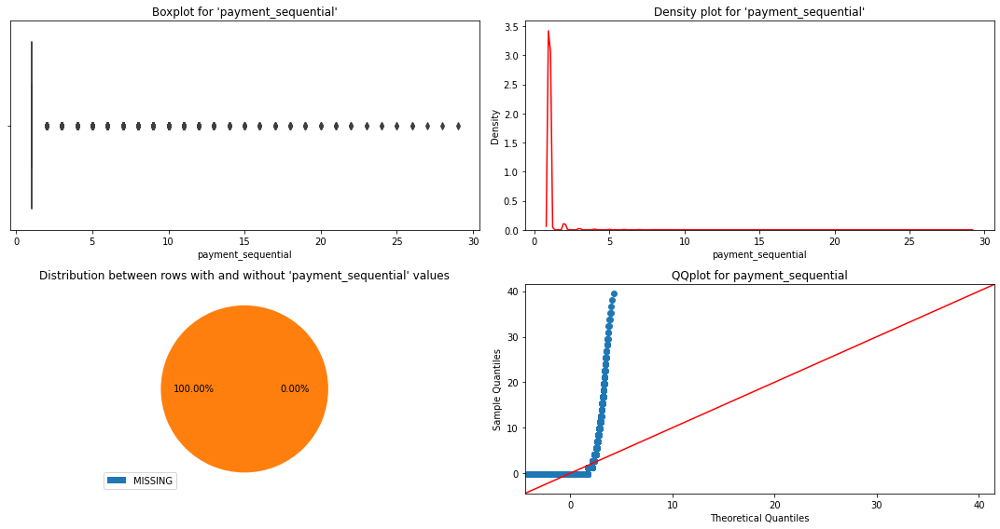

'payment_sequential' is missing 0 over 103886 (0.00%)


<function __main__.select_quantitative6(column_name)>

In [97]:
vars_numericals6 = data_payments.select_dtypes(include='number').columns
data_interact_quanti6 = data_payments[vars_numericals6].copy()  # .sample(frac=0.1)


def select_quantitative6(column_name):
    explore_quantitative(data_interact_quanti6, column_name)


interact(select_quantitative6, column_name=vars_numericals6)

In [98]:
data_payments.describe().T

,count,mean,std,min,25%,50%,75%,max
payment_sequential,103886.0,1.092679,0.706584,1.0,1.00,1.0,1.0000,29.00
payment_installments,103886.0,2.853349,2.687051,0.0,1.00,1.0,4.0000,24.00
payment_value,103886.0,154.100380,217.494064,0.0,56.79,100.0,171.8375,13664.08


>#### On constate que:
> - les séquences de paiement `payment_sequential` vont de 1 à 29.<br>
>Si la très grande majorité se place à 1, le fait d'avoir jusqu'à 29 moyens de paiement n'a rien d'abérrant, c'est juste atypique *(on peut supposer que ce sont de multiples bons cadeaux)*; ça semble OK.
> - l'étalement des paiements `payment_installments` va de 0 à 24 avec une mediane à 1.<br>
>Si encore une fois une grande valeur est atypique mais pas abérrantes, il n'en va pas de même pour le 0 qui est clairement abérrant; il faut les supprimer valeurs à 0.
> - les montants des paiements `payment_value` s'étalent de 0 à 13664.8<br>
>Là on constate que les deux extrêmes sont abérrants (13665 en soit n'est pas abérrant, mais quand on regarde le boxplot il est vraiment très loin des autres montants atypiques)

#### Regardons de plus près ces valeurs abérrantes

In [99]:
data_payments[data_payments.payment_installments <= 0]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
46982,744bade1fcf9ff3f31d860ace076d422,2,credit_card,0,58.69
79014,1a57108394169c0b47d8f876acc9ba2d,2,credit_card,0,129.94


In [100]:
data_payments[(data_payments.payment_value <= 0) | (data_payments.payment_value > 9000)]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.00
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.00
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.00
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.00
52107,03caa2c082116e1d31e67e9ae3700499,1,credit_card,1,13664.08
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.00
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.00
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.00
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.00
100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.00


In [101]:
data_payments[data_payments.payment_type == 'voucher'].payment_value.mean()

65.70335411255411

>#### On a donc en effet 12 lignes problèmatiques qu'il est préférable de supprimer.

In [102]:
data_payments = data_payments[data_payments.payment_installments > 0]
data_payments = data_payments[(data_payments.payment_value > 0) & (data_payments.payment_value < 9000)]
data_payments.shape

(103874, 5)

### Valeurs manquantes

In [103]:
_ = print_fill_rate(data_payments, data_payments.columns)

         COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
            order_id |               0 |          100.00%
  payment_sequential |               0 |          100.00%
        payment_type |               0 |          100.00%
payment_installments |               0 |          100.00%
       payment_value |               0 |          100.00%


> Aucune valeur n'est manquante

### Valeurs uniques

In [104]:
data_payments.nunique()

order_id                99434
payment_sequential         29
payment_type                4
payment_installments       23
payment_value           29074
dtype: int64

#### Regardons plus en détails les valeurs de l'unique colonne catégorielle

In [105]:
print_unique(data_payments, ['payment_type'])

payment_type        
['credit_card' 'boleto' 'voucher' 'debit_card']



### Doublons

#### Regardons si il y des produits en double sur la base de la colonne `order_id`

In [106]:
data_payments.duplicated(subset=['order_id']).sum()

4440

>#### On a donc environ 4500 doublons, mais ce n'est **pas une anomalie**;
> chaque ligne associant un unique moyen de paiement *(moyen de paiement, PAS paiement)* à une commande, il faut plusieurs lignes pour un panier réglé avec plusieurs sources de paiements (CB + bons cadeaux + ...).

#### Vérifions donc si il y a des doublons en incluant `payment_sequential`

In [107]:
data_payments.duplicated(subset=['order_id', 'payment_sequential']).sum()

0

>#### Il y a donc visiblement aucun doublon.

## 6.2 Analyses multivariées <a class="anchor" id="data_payments_multi"></a> [⇪](#menu)

### Regardons comment se répartissent les moyens de paiements

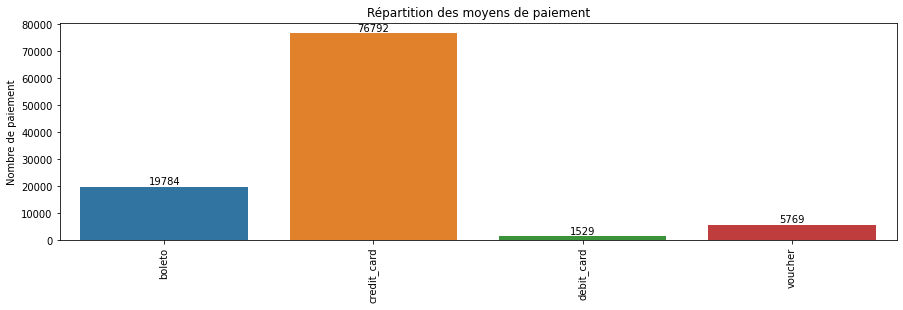

In [108]:
selection = pd.DataFrame(data_payments.payment_type.value_counts().sort_index()).T
plot_bars(selection, "Répartition des moyens de paiement", y_label="Nombre de paiement")

>#### On constate que la très grande majorité des paiements se font par carte de crédit.
> 1. `credit_card` **74%**
> 2. `boleto` **19%**
> 3. `voucher` **6%**
> 4. `debit_card` **1%**

### Regardons le montant moyen de paiements selon le moyen de paiement utilisé

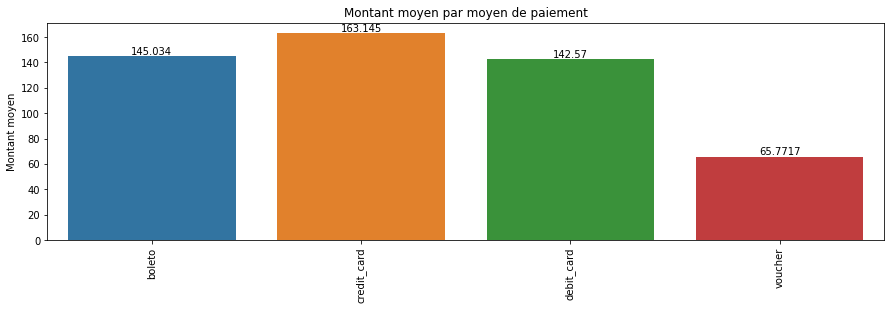

In [109]:
selection = pd.DataFrame(data_payments.groupby('payment_type').payment_value.mean().sort_index()).T
plot_bars(selection, "Montant moyen par moyen de paiement", y_label="Montant moyen")

>#### Le montant à payer ne semble pas particulièrement corrélé avec le moyen utilisé.

---
>#### `TODO`  done ✅ | todo ❌ |
> - ✅ **Remove outliers** based on the `payment_installments` et `payment_value`<br><u>*(action: c'est fait un peu plus haut et exporté ci-dessous, mais ça ne s'applique pas sur les analyses faites plus haut avec les colonnes de ce jeu de données)*</u>
> - ❌ **Analyse multivariée** : peut-on associer les moyens de paiement et la position géographique (customer_city ou customer_state) ?
> - ❌ **Analyse multivariée** : peut-on associer les moyens de paiement et les catégories de produits (product_category_name) ?


In [110]:
data_payments.to_csv('data/olist_order_payments_dataset_clean.csv', index=False)

---
---
# 7. `olist_sellers_dataset.csv` <a class="anchor" id="data_sellers"></a> [⇪](#menu)

In [111]:
data_sellers.sample(5)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
1465,54965bbe3e4f07ae045b90b0b8541f52,85851,foz do iguacu,PR
1366,65febd49fd28ec955651299159b1f527,3275,sao paulo,SP
1060,cb5df0dcb9e280b1780e9d589889f2c7,15115,bady bassitt,SP
2818,5c243662ce92d84573bfaff24c3e3700,3702,sao paulo,SP


>#### On a un dataset qui propose les informations de propres aux vendeurs *(ici il y en a peu car le jeu de données a été anonymisé)*.
> - `seller_id` est un ID constant pour un fournisseur donné
> - `seller_zip_code_prefix` est un ID *(le code postal en fait)* permettant d'avoir plus d'indicateurs géographiques via `olist_geolocation_dataset.csv`
> - `seller_city` est la ville du fournisseur *(que l'on retrouve sous le nom de `geolocation_city` dans `olist_geolocation_dataset.csv` via `customer_zip_code_prefix`)*
> - `seller_state` est la région du fournisseur *(que l'on retrouve sous le nom de `geolocation_state` dans `olist_geolocation_dataset.csv` via `customer_zip_code_prefix`)*

In [112]:
print_dataset_shape(data_sellers)

Ce dataset contient 3095 entrées décrites par 4 variables


## 7.1 Vérifications de base <a class="anchor" id="data_sellers_checks"></a> [⇪](#menu)

----- UNIVARIATE ANALYSIS for "seller_zip_code_prefix" -----

count     3095.000000
mean     32291.059451
std      32713.453830
min       1001.000000
25%       7093.500000
50%      14940.000000
75%      64552.500000
max      99730.000000
Name: seller_zip_code_prefix, dtype: float64




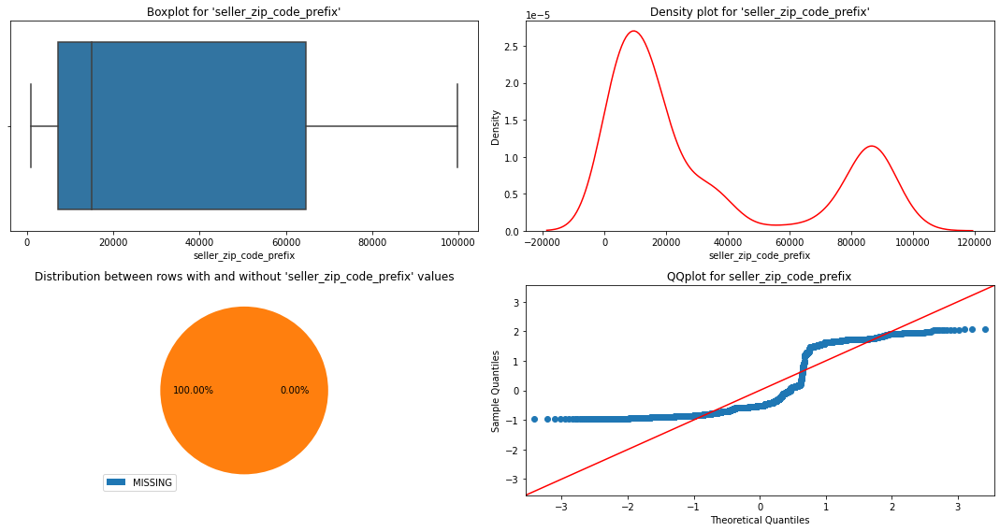

'seller_zip_code_prefix' is missing 0 over 3095 (0.00%)


In [113]:
explore_quantitative(data_sellers, 'seller_zip_code_prefix')

>#### Dans la mesure ou le code postal est décrit comme étant composé de 5 chiffres, il ne semble pas y avoir de valeurs aberrantes.

### Valeurs manquantes

In [114]:
_ = print_fill_rate(data_sellers, data_sellers.columns)

           COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
             seller_id |               0 |          100.00%
seller_zip_code_prefix |               0 |          100.00%
           seller_city |               0 |          100.00%
          seller_state |               0 |          100.00%


>#### Aucune valeur n'est manquante

### Valeurs uniques

In [115]:
data_sellers.nunique()

seller_id                 3095
seller_zip_code_prefix    2246
seller_city                611
seller_state                23
dtype: int64

>#### On constate que les fournisseurs se répartissent :
> - dans 2246 des 19015 code postaux trouvés dans `olist_geolocation_dataset.csv`
> - dans 611 des 8011 villes trouvées dans `olist_geolocation_dataset.csv`
> - dans 23 des 27 états trouvés dans `olist_geolocation_dataset.csv`
>
>#### Par ailleurs on remarque également que l'on retrouve:
> - l'ensemble des 3095 fournisseurs identifiés dans `olist_order_items_dataset.csv`

#### Regardons plus en détails les valeurs des colonnes catégorielles

In [116]:
print_unique(data_sellers, ['seller_zip_code_prefix', 'seller_city', 'seller_state'])

seller_zip_code_prefix
[13023 13844 20031 ...  4650 96080 12051]

seller_city         
['campinas' 'mogi guacu' 'rio de janeiro' 'sao paulo' 'braganca paulista'
 'brejao' 'penapolis' 'curitiba' 'anapolis' 'itirapina' 'tubarao'
 'lauro de freitas' 'imbituba' 'brasilia' 'porto seguro' 'guaruja'
 'tabatinga' 'salto' 'tres de maio' 'belo horizonte' 'arapongas'
 'sao bernardo do campo' 'tatui' 'garopaba' 'camanducaia' 'tupa'
 'guarulhos' 'sao jose dos pinhais' 'sao ludgero' 'sao jose' 'piracicaba'
 'porto alegre' 'congonhal' 'santo andre' 'osasco' 'valinhos' 'joinville'
 'saquarema' 'barra velha' 'petropolis' 'santo antonio da patrulha'
 'ponta grossa' 'santana de parnaiba' 'sao carlos' 'ibitinga' 'barueri'
 'caxias do sul' 'araguari' 'contagem' 'jaragua do sul' 'lages - sc'
 'bento goncalves' 'catanduva' 'ribeirao pires' 'jaboticabal' 'echapora'
 'cotia' 'rio do sul' 'sorocaba' 'pradopolis' 'itaborai' 'mirassol'
 'birigui' 'assis' 'jaguariuna' 'araraquara' 'macae' 'rio claro'
 'londrina' '

>#### La plupart des labels sont propres, mais il y a des doublons ou des erreurs dans les noms de villes.
> - Certaines villes au nom composé avec des tirets sont retrouvables sans tirets, il en va de même avec les accents ==> `são paulo`, `sao paulo`, `sao-paulo` etc...
> - D'autres sont en fait des addresses email: `vendas@creditparts.com.br`
> - Et l'on trouve aussi des noms composés: `rio de janeiro \\rio de janeiro`

#### Appliquons une fonction pour harmoniser le format

In [117]:
data_sellers.seller_city = data_sellers.seller_city.apply(remove_format)

### Doublons

In [118]:
data_sellers.duplicated().sum()

0

>#### Il y a donc visiblement aucun doublon.

## 7.2 Analyses multivariées <a class="anchor" id="data_sellers_multi"></a> [⇪](#menu)

### Regardons quelle fraction des fournisseurs ont vendu plus d'une fois sur le site

In [119]:
selection = pd.DataFrame(data_items.seller_id.value_counts())
selection = selection[selection.seller_id > 1]

ratio_multi = selection.shape[0] / data_sellers.shape[0]
ratio_single = 1.0 - ratio_multi

print(f"Il y a {ratio_multi * 100:.2f}% des fournisseurs qui ont vendu plusieurs fois")

Il y a 83.55% des fournisseurs qui ont vendu plusieurs fois


<Figure size 360x288 with 0 Axes>

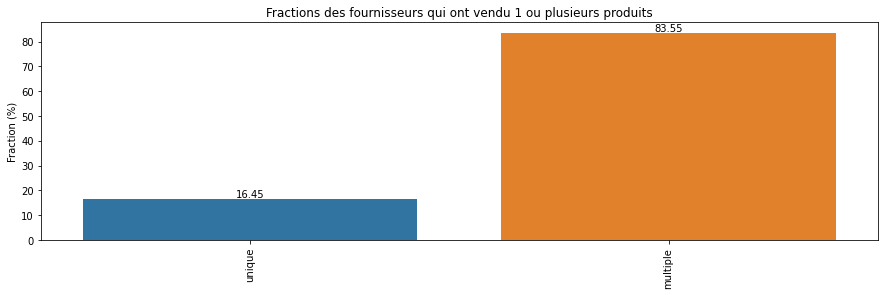

In [120]:
fig = plt.figure(figsize=(5, 4))
selection = pd.DataFrame({'unique': [round(ratio_single*100,2)], 'multiple': [round(ratio_multi*100,2)]})

plot_bars(selection, "Fractions des fournisseurs qui ont vendu 1 ou plusieurs produits", y_label='Fraction (%)')

### Regardons la répartition des fournisseurs par région *(`seller_state`)*

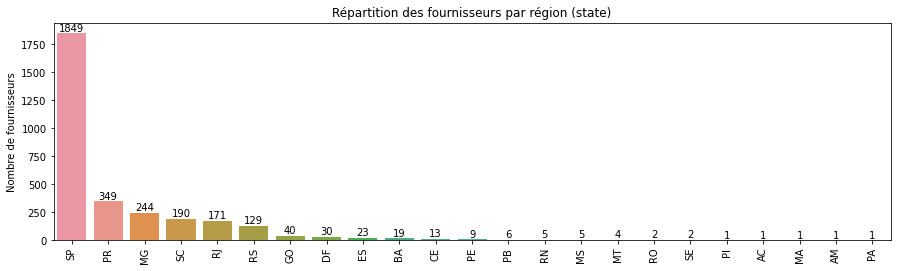

In [121]:
selection = pd.DataFrame(data_sellers.seller_state.value_counts()).T
plot_bars(selection, "Répartition des fournisseurs par région (state)", y_label="Nombre de fournisseurs")

### Regardons la répartition des fournisseurs par ville *(`seller_city`)*

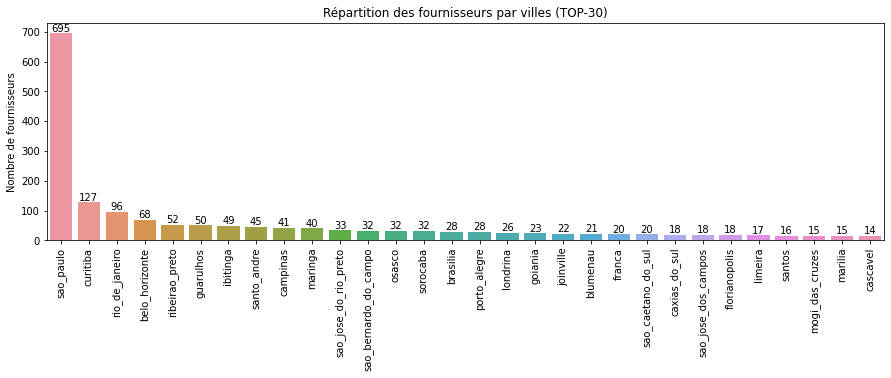

In [122]:
top_size = 30
selection = pd.DataFrame(data_sellers.seller_city.value_counts()[:top_size]).T
plot_bars(selection, f"Répartition des fournisseurs par villes (TOP-{top_size})", y_label="Nombre de fournisseurs")

### Affichons à présent une carte pour se faire une idée plus précise et visuelle de la réparition géographique

In [123]:
left = data_sellers.set_index(['seller_zip_code_prefix']).copy()
right = data_geo.set_index(['geolocation_zip_code_prefix']).copy()

selection = left.join(right)
selection.reset_index(inplace=True)
selection.rename(columns={'index': 'seller_zip_code_prefix'}, inplace=True)

# Supprimons les éventuels coordonnées GPS vides
selection.dropna(subset=['geolocation_lat', 'geolocation_lng'], inplace=True)

In [124]:
# Ici on instantie Folium avec des coordonnées de départ et un zoom raisonnable
map_ = folium.Map(location=["-10", "-46"], zoom_start=4, scrollWheelZoom=False)  # width=1100, height=1100, 

# Puis on ajoute chacun des points d'intéret sur notre map
map_.add_child(FastMarkerCluster(

        selection[["geolocation_lat", "geolocation_lng", "seller_zip_code_prefix", "geolocation_city", "geolocation_state"]].values.tolist(), 
        showCoverageOnHover=True,
        spiderfyOnMaxZoom=False,
        disableClusteringAtZoom=20,
        callback=callback
))

folium.GeoJson(brazil, name="Brazil").add_to(map_) # , tooltip="Brazil"
# Et on l'affiche
map_

>#### On constate que l'essentiel des fournisseurs sont dans la région du Sud-Est *(Sao-Paulo / Rio de Janeiro / ...)* comme les clients.
> Probablement parcque ce sont les régions avec la plus forte densité de population.

#### Vérifions combien de commandes ont été passées se situent en dehors des frontières géographiques du Brésil.

In [125]:
count_out = 0
for i, x in selection.T.iteritems():
    point = Feature(geometry=Point([x.geolocation_lng, x.geolocation_lat]))
    isin = boolean_point_in_polygon(point, polygon)
    if not isin:
        count_out += 1
        # print(x)
print(f"Sur les {selection.shape[0]} fournisseurs enregistrés, {count_out} sont situés hors du Brésil terrestre.")

Sur les 3088 fournisseurs enregistrés, 0 sont situés hors du Brésil terrestre.


>#### Aucun des fournisseurs ne semble être installé hors des frontières **terrestres** *(et approximatives)* du Brésil.

---
>#### `TODO`  done ✅ | todo ❌ |
> - ✅ Dans l'analyse multivariée, regarder le nombre de fournisseurs qui vendent plus d'une fois.<br><u>*(action: fait un peu plus haut dans la section Analyses Multivariées)*</u>
> - ✅ Remplacer les caractères spéciaux dans les noms de villes pour supprimer les problèmes de doublons.<br><u>*(action: fait un peu plus haut dans la section Valeurs uniques)*</u>
> - ❌ Traiter les noms de villes outliers (email, sectionnés avec des /, ...) **??**

In [126]:
data_sellers.to_csv('data/olist_sellers_dataset_clean.csv', index=False)

---
---
# 8. `olist_order_reviews_dataset.csv` <a class="anchor" id="data_reviews"></a> [⇪](#menu)

In [127]:
data_reviews.sample(5)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
11814,6ef481746f25161fb4dafd2adc000640,23f10f509600c30cf2852f9dbdf28fc3,5,NaN,NaN,2018-05-17 00:00:00,2018-05-20 19:34:41
5732,986c98411cd88db4d6cbd762d1c15299,48ba3085b546be02a30dc763f2e3215e,5,NaN,"Meu esposo recebeu, estou no interior e quando...",2018-02-06 00:00:00,2018-02-08 15:00:18
59838,5e79c8a72d4bed0185c9bd01d2ea6551,40b78093269252ad30000071c00f5c9a,2,NaN,NaN,2017-08-18 00:00:00,2017-08-21 18:15:32
45198,dbae1bca1c8d6b9b3cf6042f547996f4,a25d43b087190f76ed13ac240693ded6,5,NaN,NaN,2018-06-20 00:00:00,2018-06-23 00:19:32
95026,4d996552b5d7505e90aae17f2d4d4bd8,954945beeb5990c532ac06d464edf931,4,NaN,NaN,2017-11-17 00:00:00,2017-11-17 23:34:11


>#### On a un dataset qui regroupe les réponses aux questionnaires de satisfaction envoyés aux clients à la suite d'une commande.
> - `review_id` est l'ID de l'avis donné
> - `order_id` est est l'ID de la commande à laquelle est associé l'avis
> - `review_score` est la note donnée à la commande
> - `review_comment_title` est le titre de l'éventuel commentaire ajouté à la réponse
> - `review_comment_message` est le texte de l'éventuel commentaire ajouté à la réponse
> - `review_creation_date` est la date à laquelle l'email invitant à répondre au questionnaire de satisfaction a été envoyé
> - `review_answer_timestamp` est la date à laquelle le client à donné son avis

In [128]:
print_dataset_shape(data_reviews)

Ce dataset contient 99224 entrées décrites par 7 variables


## 8.1 Vérifications de base <a class="anchor" id="data_reviews_checks"></a> [⇪](#menu)

----- UNIVARIATE ANALYSIS for "review_score" -----

count    99224.000000
mean         4.086421
std          1.347579
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: review_score, dtype: float64




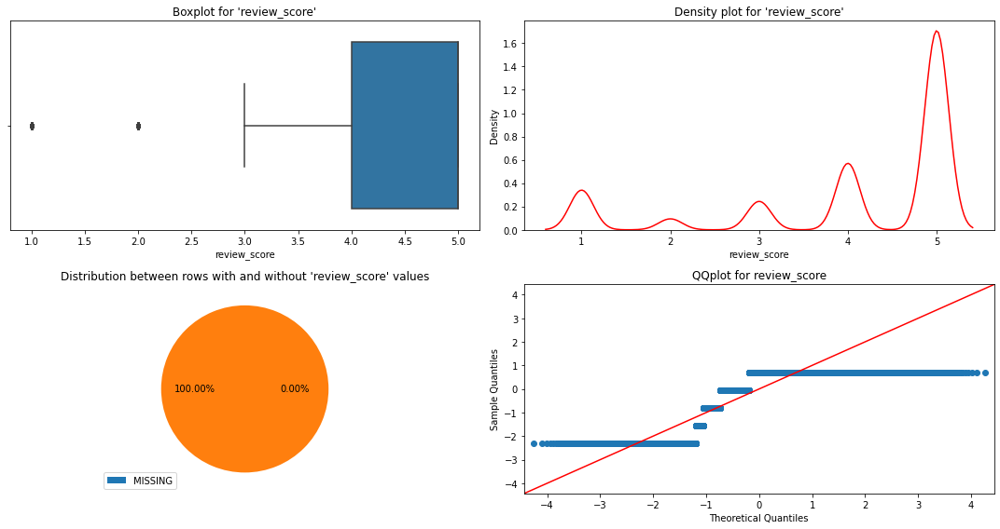

'review_score' is missing 0 over 99224 (0.00%)


In [129]:
explore_quantitative(data_reviews, 'review_score')

>#### On constate que:
> - L'énorme majoritée des notes sont très bonnes *(plus de 75% de 4+ sur 5)*
> - Les valeurs min et max (1 et 5) sont logiques et acceptables.

### Valeurs manquantes

In [130]:
_ = print_fill_rate(data_reviews, data_reviews.columns)

            COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
              review_id |               0 |          100.00%
               order_id |               0 |          100.00%
           review_score |               0 |          100.00%
   review_comment_title |           87656 |           11.66%
 review_comment_message |           58247 |           41.30%
   review_creation_date |               0 |          100.00%
review_answer_timestamp |               0 |          100.00%


>#### On constate que:
> - Il ne manque aucun score.
> - Il manque près de 90% des titres de commentaires; ça ne me semble pas dénué de sens... un titre ne semble pas avoir vraiment d'utilité dans ce contexte.
> - Il manque près de 60% des commentaires; ça ne semble pas dénué de sens... les commentaires ne sont ajoutés que lorsqu'il y a quelque chose à dire en plus de ce qu'exprime le score.

> Ces valeurs manquantes ne peuvent pas être imputées, ce sont des textes <br>*(qui plus est sans contexte suffisant même pour une analyse de sentiment)*.
>
> Ces taux de remplissage assez bas, pourraient être un problème si l'on cherchait à faire une analyse de texte avec des techniques NLP, mais ici on pourra les remplacer par une valeurs booleens indiquant si ils ont été saisis ou pas.

### Valeurs uniques

In [131]:
data_reviews.describe(exclude='number').T

,count,unique,top,freq
review_id,99224,98410,7b606b0d57b078384f0b58eac1d41d78,3
order_id,99224,98673,c88b1d1b157a9999ce368f218a407141,3
review_comment_title,11568,4527,Recomendo,423
review_comment_message,40977,36159,Muito bom,230
review_creation_date,99224,636,2017-12-19 00:00:00,463
review_answer_timestamp,99224,98248,2017-06-15 23:21:05,4


>#### On constate que:
> - il y a des doublons dans toutes les colonnes
> - le titre de commentaire le plus fréquent est `Recomendo`  que l'on peut traduire par `Recommandation` ou `Suggestion`
> - le texte de commentaire le plus fréquent est `Multo bom` que l'on peut traduire par `Très bien`

### Doublons

#### Regardons si il y des avis en double sur la base de la colonne `review_id`

In [132]:
data_reviews.duplicated(subset=['review_id']).sum()

814

> Il y a donc visiblement des doublons, mais regardons à quoi ils ressemblent

In [133]:
data_tmp = data_reviews[(data_reviews.review_id == '03a6a25db577d0689440933055111897')]
data_tmp

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1988,03a6a25db577d0689440933055111897,2acfdc5131ff2cf4433e668454c9784c,5,NaN,Muito Bom! Gostei Bastante! Tecido Ótimo! Aten...,2017-12-15 00:00:00,2017-12-16 01:32:18
9013,03a6a25db577d0689440933055111897,3fde8b7313af6b37b84b5c7594d7add0,5,NaN,Muito Bom! Gostei Bastante! Tecido Ótimo! Aten...,2017-12-15 00:00:00,2017-12-16 01:32:18


> On a donc deux reviews en tous points identiques sauf pour l'`order_id` <br>
> Vérifions si ces deux commandes ont été passées en même temps et/ou par le même utilisateur

In [134]:
ids = data_tmp.order_id.values
data_tmp = data_orders.merge(data_customer, on='customer_id', how='left')
data_tmp[data_tmp.order_id.isin(ids)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
75402,3fde8b7313af6b37b84b5c7594d7add0,248307eaf63a58203c675fccab2d1002,delivered,2017-11-27 22:36:14,2017-11-30 16:27:02,2017-12-01 16:12:34,2017-12-14 19:38:42,2018-01-02 00:00:00,17.0,370cd3b09ea745fe047fd11db7430441,53370,olinda,PE
91138,2acfdc5131ff2cf4433e668454c9784c,181b56f69c22bcb0ceeceba56c06d239,delivered,2017-11-27 22:36:13,2017-11-29 12:31:42,2017-11-29 20:21:48,2017-12-07 17:41:29,2017-12-22 00:00:00,10.0,370cd3b09ea745fe047fd11db7430441,53370,olinda,PE


> Les deux commandes ont donc été passées sensiblement en même temps par le même utilisateur.

>#### On peut donc supposer que le système d'Olist demande l'avis pour plusieurs commandes passées à peu près en même temps lors de l'envoi du questionnaire de satisfaction.

#### Vérifions donc si il y a des doublons en incluant `order_id`

In [135]:
data_reviews.duplicated(subset=['review_id', 'order_id']).sum()

0

>#### Il y a donc visiblement aucun doublon.

## 8.2 Analyses multivariées <a class="anchor" id="data_reviews_multi"></a> [⇪](#menu)

### Regardons comment se répartissement les envoi d'emails pour questionnaires de satisfaction

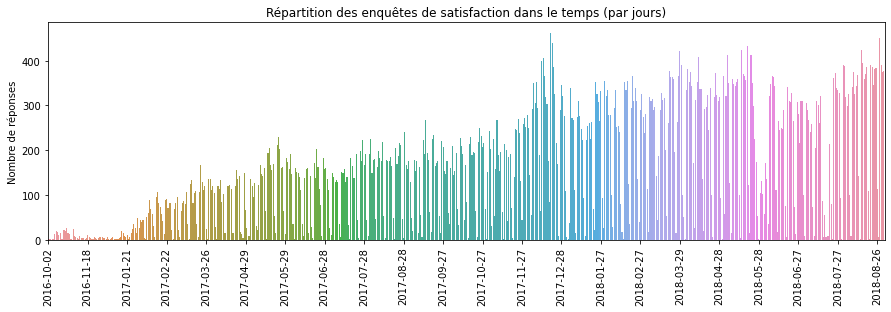

In [136]:
selection = data_reviews[['review_id', 'order_id', 'review_creation_date']].copy()
selection['short_date'] = selection.review_creation_date.apply(lambda x: x[:10])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T

plot_bars(selection, "Répartition des enquêtes de satisfaction dans le temps (par jours)", y_label='Nombre de réponses', labels_modulo=30, show_values=False)

### Regardons comment se répartissement les réponses aux questionnaires de satisfaction

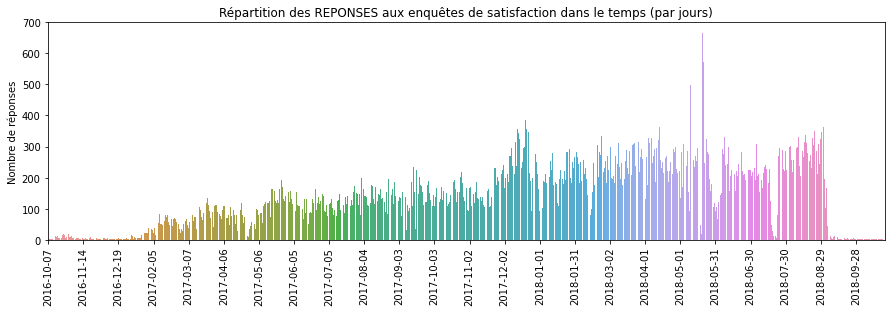

In [137]:
selection = data_reviews[['review_id', 'order_id', 'review_answer_timestamp']].copy()
selection['short_date'] = selection.review_answer_timestamp.apply(lambda x: x[:10])
selection = pd.DataFrame(selection.groupby('short_date').size(), columns=['count']).T

plot_bars(selection, "Répartition des REPONSES aux enquêtes de satisfaction dans le temps (par jours)", y_label='Nombre de réponses', labels_modulo=30, show_values=False)

### Regardons les délais de réponse

In [138]:
def convert_time(x):
    return datetime.datetime.strptime(x[:10], '%Y-%m-%d')


selection = data_reviews[['review_id', 'order_id', 'review_creation_date','review_answer_timestamp']].copy()
selection['review_creation_date'] = selection['review_creation_date'].apply(convert_time)
selection['review_answer_timestamp'] = selection['review_answer_timestamp'].apply(convert_time)
data_reviews['diff_dates'] = selection['review_answer_timestamp'] - selection['review_creation_date']
data_reviews['diff_dates'] = data_reviews['diff_dates'].apply(lambda x: x.days)
data_reviews.head(3)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,diff_dates
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,0
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13,1
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24,1


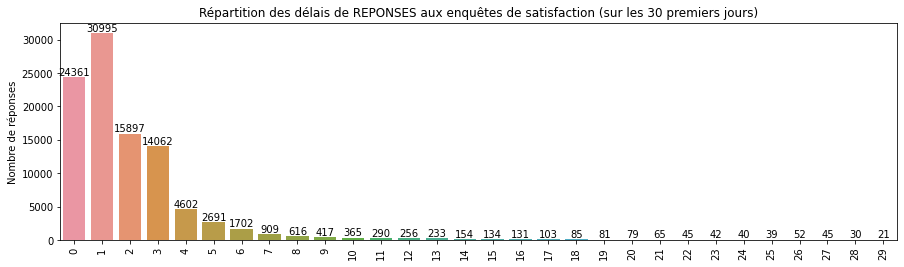

In [139]:
selection = pd.DataFrame(data_reviews.groupby('diff_dates').size(), columns=['count'])[:30].T    
plot_bars(selection, "Répartition des délais de REPONSES aux enquêtes de satisfaction (sur les 30 premiers jours)", y_label='Nombre de réponses', labels_modulo=1, show_values=True)

In [140]:
selection2 = pd.DataFrame(data_reviews.groupby('diff_dates').size(), columns=['count'])
selection2.T

diff_dates,0,1,2,3,4,5,6,7,8,9,...,367,383,411,412,433,446,471,508,512,518
count,24361,30995,15897,14062,4602,2691,1702,909,616,417,...,1,1,1,1,1,1,1,1,1,1


>#### On constate que:
> - la grande majorité des réponses aux enquêtes se font sous 10 jours
> - certaines réponses peuvent survenir jusqu'à 1 an et demi après l'envoi de l'email...

---
>#### `TODO`  done ✅ | todo ❌ |
> - ❌ **remplacer les colonnes de messages** *(review_comment_message)* **et titres** *(review_comment_title)* par des colonnes de booleans indiquant si ils ont été rédigés ou pas **??**

In [141]:
data_reviews.to_csv('data/olist_order_reviews_dataset_clean.csv', index=False)

---
---
# 9. `product_category_name_translation.csv` <a class="anchor" id="data_categories"></a> [⇪](#menu)

In [142]:
data_categories.sample(5)

,product_category_name,product_category_name_english
57,livros_importados,books_imported
17,fashion_bolsas_e_acessorios,fashion_bags_accessories
12,papelaria,stationery
62,casa_conforto_2,home_comfort_2
15,telefonia_fixa,fixed_telephony


>#### On a un dataset qui permet de convertir les noms de catégories du Portugais à l'Anglais.
> - `product_category_name` est le nom de la catégorie en Portugais
> - `product_category_name_english` est le nom de la catégorie en Anglais

In [143]:
print_dataset_shape(data_categories)

Ce dataset contient 71 entrées décrites par 2 variables


## 4.1 Vérifications de base <a class="anchor" id="data_categories_checks"></a> [⇪](#menu)

In [144]:
data_categories.describe().T

,count,unique,top,freq
product_category_name,71,71,beleza_saude,1
product_category_name_english,71,71,health_beauty,1


>#### On constate que:
> - les 71 des 73 catégories disponibles dans `olist_products_dataset.csv`, sont présentes & traduites.
> - il n'y a aucun doublon ni sur le Portugais ni sur l'Anglais *(freq=1)*

### Valeurs manquantes

In [145]:
_ = print_fill_rate(data_categories, data_categories.columns)

                  COLUMN NAME |    EMPTY ROWS   |    FILLING RATE 
---------------------------------------------------------------------------------------------------------------
        product_category_name |               0 |          100.00%
product_category_name_english |               0 |          100.00%


> Aucune valeur n'est manquante

---
>#### `TODO`  done ✅ | todo ❌ |
> Rien
---

In [146]:
# data_categories.to_csv('data/product_category_name_translation_clean.csv', index=False)